# Load Data

In [1]:
import torch
import pandas as pd
import scanpy as sc
import numpy as np
import scipy.stats
from pathlib import Path
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests
import matplotlib.patches as patches

## Load embeddings and aligned data

In [2]:
embeddings = torch.load("SHINE embeddings.pt")
emb_combined = embeddings['emb_combined']
emb_recon_transcript = embeddings['emb_recon_transcript']
emb_recon_metabolite = embeddings['emb_recon_metabolite']
emb_latent_transcript = embeddings['emb_latent_transcript']
emb_latent_metabolite = embeddings['emb_latent_metabolite']

In [3]:
transcript_info = pd.read_csv("aligned_ST_data.csv")
transcript_expr = transcript_info.iloc[:, 3:]
print(transcript_expr)
genes = transcript_expr.columns
genes

        Adhfe1       Vxn  1700034P13Rik     Cspp1  Lactb2  Rdh10  Gsta3  \
0     0.000000  0.000000            0.0  0.000000     0.0    0.0    0.0   
1     1.042825  0.000000            0.0  0.000000     0.0    0.0    0.0   
2     0.000000  0.000000            0.0  0.000000     0.0    0.0    0.0   
3     0.000000  0.000000            0.0  0.000000     0.0    0.0    0.0   
4     0.000000  0.000000            0.0  0.762384     0.0    0.0    0.0   
...        ...       ...            ...       ...     ...    ...    ...   
3029  0.000000  1.395553            0.0  0.000000     0.0    0.0    0.0   
3030  0.000000  1.053046            0.0  0.000000     0.0    0.0    0.0   
3031  0.000000  0.913569            0.0  0.000000     0.0    0.0    0.0   
3032  0.845094  0.000000            0.0  0.000000     0.0    0.0    0.0   
3033  0.000000  0.000000            0.0  0.000000     0.0    0.0    0.0   

          Phf3  Uggt1    Arid5a  ...   Gprasp1   Gprasp2    Psmd10  Tmem29  \
0     0.000000    0.0

Index(['Adhfe1', 'Vxn', '1700034P13Rik', 'Cspp1', 'Lactb2', 'Rdh10', 'Gsta3',
       'Phf3', 'Uggt1', 'Arid5a',
       ...
       'Gprasp1', 'Gprasp2', 'Psmd10', 'Tmem29', 'Alas2', 'Sat1', 'Sh3kbp1',
       'Gpm6b', 'CAAA01118383.1', 'CR974586.4'],
      dtype='object', length=2000)

In [4]:
metabolite_info = pd.read_csv("aligned_SM_data.csv")
metabolite_abundance = metabolite_info.iloc[:, 3:]
print(metabolite_abundance)
metabolites = metabolite_abundance.columns
metabolites

      156.26059  156.26195  156.48344  156.4838   156.485  157.54681  \
0      0.814714   0.393074   0.000000  0.000000  0.000000   0.000000   
1      0.000000   0.000000   0.000000  0.000000  0.000000   0.000000   
2      0.000000   0.000000   0.299323  0.594104  0.000000   0.000000   
3      0.000000   0.000000   0.000000  0.000000  0.000000   0.638206   
4      0.000000   0.000000   0.000000  0.000000  0.000000   0.000000   
...         ...        ...        ...       ...       ...        ...   
3029   0.000000   0.505267   0.000000  0.000000  0.000000   0.000000   
3030   1.203031   0.000000   0.000000  0.000000  0.146572   0.000000   
3031   0.000000   0.000000   0.000000  0.000000  0.425612   0.000000   
3032   0.000000   0.000000   0.000000  0.000000  0.000000   0.000000   
3033   0.000000   0.000000   0.000000  0.000000  0.000000   0.000000   

      158.41217  160.02547  170.45622  170.45738  ...  1044.29885  1044.3523  \
0      0.000000   0.000000   1.278071   0.000000  ...  

Index(['156.26059', '156.26195', '156.48344', '156.4838', '156.485',
       '157.54681', '158.41217', '160.02547', '170.45622', '170.45738',
       ...
       '1044.29885', '1044.3523', '1046.31366', '1046.32671', '1046.33977',
       '1046.36442', '1048.32025', '1048.3319', '1048.34354', '1048.38431'],
      dtype='object', length=1538)

In [5]:
# Load original Visium AnnData
visium_path = Path("V11L12-109_B1/output_data/V11L12-109_B1_RNA/outs")
adata = sc.read_visium(path=visium_path)
adata.var_names_make_unique()

# Load matched transcript and metabolite info
transcript_info = pd.read_csv("aligned_ST_data.csv", index_col='spot')

barcodes_filtered = transcript_info.index.intersection(adata.obs_names)
adata_filtered = adata[barcodes_filtered, :].copy()

transcript_info = transcript_info.loc[barcodes_filtered, :]
adata_filtered = adata_filtered[transcript_info.index, :]

adata_filtered.obsm['spatial'] = adata_filtered.obsm['spatial']
adata_filtered

/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3034 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
assert emb_combined.shape[0] == adata_filtered.n_obs, "Mismatch in combined embedding rows!"

for factor_idx in range(emb_combined.shape[1]):
    adata_filtered.obs[f'latent_combined_{factor_idx+1}'] = emb_combined[:, factor_idx]

print(adata_filtered.obs.iloc[:, -10:].head())
adata_filtered

                    latent_combined_247  latent_combined_248  \
AAACAAGTATCTCCCA-1             0.009046                  0.0   
AAACATTTCCCGGATT-1             0.009004                  0.0   
AAACCCGAACGAAATC-1             0.008425                  0.0   
AAACCGGAAATGTTAA-1             0.008292                  0.0   
AAACCGGGTAGGTACC-1             0.008793                  0.0   

                    latent_combined_249  latent_combined_250  \
AAACAAGTATCTCCCA-1                  0.0                  0.0   
AAACATTTCCCGGATT-1                  0.0                  0.0   
AAACCCGAACGAAATC-1                  0.0                  0.0   
AAACCGGAAATGTTAA-1                  0.0                  0.0   
AAACCGGGTAGGTACC-1                  0.0                  0.0   

                    latent_combined_251  latent_combined_252  \
AAACAAGTATCTCCCA-1                  0.0             0.089611   
AAACATTTCCCGGATT-1                  0.0             0.089740   
AAACCCGAACGAAATC-1                  0.

/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/1756032935.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata_filtered.obs[f'latent_combined_{factor_idx+1}'] = emb_combined[:, factor_idx]
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/1756032935.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata_filtered.obs[f'latent_combined_{factor_idx+1}'] = emb_combined[:, factor_idx]
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/1756032935.py:4: PerformanceWarning: DataFram

AnnData object with n_obs × n_vars = 3034 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'latent_combined_1', 'latent_combined_2', 'latent_combined_3', 'latent_combined_4', 'latent_combined_5', 'latent_combined_6', 'latent_combined_7', 'latent_combined_8', 'latent_combined_9', 'latent_combined_10', 'latent_combined_11', 'latent_combined_12', 'latent_combined_13', 'latent_combined_14', 'latent_combined_15', 'latent_combined_16', 'latent_combined_17', 'latent_combined_18', 'latent_combined_19', 'latent_combined_20', 'latent_combined_21', 'latent_combined_22', 'latent_combined_23', 'latent_combined_24', 'latent_combined_25', 'latent_combined_26', 'latent_combined_27', 'latent_combined_28', 'latent_combined_29', 'latent_combined_30', 'latent_combined_31', 'latent_combined_32', 'latent_combined_33', 'latent_combined_34', 'latent_combined_35', 'latent_combined_36', 'latent_combined_37', 'latent_combined_38', 'latent_combined_39', 'latent_combined_40', 'latent_combined_41', 'latent_c

In [7]:
for factor_idx in range(emb_combined.shape[1]):
    adata_filtered.obs[f'latent_combined_{factor_idx}'] = emb_combined[:, factor_idx]

adata_filtered.obs.head()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/3694768888.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata_filtered.obs[f'latent_combined_{factor_idx}'] = emb_combined[:, factor_idx]


,in_tissue,array_row,array_col,latent_combined_1,latent_combined_2,latent_combined_3,latent_combined_4,latent_combined_5,latent_combined_6,latent_combined_7,...,latent_combined_248,latent_combined_249,latent_combined_250,latent_combined_251,latent_combined_252,latent_combined_253,latent_combined_254,latent_combined_255,latent_combined_256,latent_combined_0
AAACAAGTATCTCCCA-1,1,50,102,0.080870,0.0,0.064450,0.0,0.095214,0.041552,0.098121,...,0.0,0.0,0.0,0.089611,0.069447,0.059318,0.001083,0.0,0.0,0.036471
AAACATTTCCCGGATT-1,1,61,97,0.080805,0.0,0.064372,0.0,0.095309,0.041571,0.097964,...,0.0,0.0,0.0,0.089740,0.069582,0.059205,0.000930,0.0,0.0,0.036562
AAACCCGAACGAAATC-1,1,45,115,0.080516,0.0,0.064932,0.0,0.095042,0.041545,0.097826,...,0.0,0.0,0.0,0.089691,0.069917,0.059334,0.000552,0.0,0.0,0.036309
AAACCGGAAATGTTAA-1,1,54,124,0.080634,0.0,0.065189,0.0,0.095045,0.041431,0.097263,...,0.0,0.0,0.0,0.089944,0.069541,0.060046,0.000552,0.0,0.0,0.035949
AAACCGGGTAGGTACC-1,1,42,28,0.080747,0.0,0.064412,0.0,0.095444,0.041618,0.098337,...,0.0,0.0,0.0,0.089974,0.069794,0.059082,0.001048,0.0,0.0,0.036537


## Annotation

In [8]:
# Load RegionLoupe labels
loupe_df = pd.read_csv(f"{visium_path}/RegionLoupe.csv")

# Rename Barcode column for consistency
loupe_df.rename(columns={'Barcode': 'barcode'}, inplace=True)

# Set barcode as index
loupe_df.set_index('barcode', inplace=True)

# Filter loupe_df to match adata_filtered.obs barcodes exactly
loupe_df_filtered = loupe_df.loc[adata_filtered.obs_names, :]

# Merge RegionLoupe labels into adata_filtered.obs
adata_filtered.obs = adata_filtered.obs.join(loupe_df_filtered, how='left')

# Check integration result
print(adata_filtered.obs.head())

                    in_tissue  array_row  array_col  latent_combined_1  \
AAACAAGTATCTCCCA-1          1         50        102           0.080870   
AAACATTTCCCGGATT-1          1         61         97           0.080805   
AAACCCGAACGAAATC-1          1         45        115           0.080516   
AAACCGGAAATGTTAA-1          1         54        124           0.080634   
AAACCGGGTAGGTACC-1          1         42         28           0.080747   

                    latent_combined_2  latent_combined_3  latent_combined_4  \
AAACAAGTATCTCCCA-1                0.0           0.064450                0.0   
AAACATTTCCCGGATT-1                0.0           0.064372                0.0   
AAACCCGAACGAAATC-1                0.0           0.064932                0.0   
AAACCGGAAATGTTAA-1                0.0           0.065189                0.0   
AAACCGGGTAGGTACC-1                0.0           0.064412                0.0   

                    latent_combined_5  latent_combined_6  latent_combined_7  \
A

In [9]:
import pandas as pd

# Load Zeisel cell type prediction results
celltype_df = pd.read_csv("Zeisel_stsc_output.csv")

# Inspect the data structure
print(celltype_df.head())

# Keep only entries with barcodes ending in "_6"
celltype_df = celltype_df[celltype_df["Unnamed: 0"].str.endswith("_6")].copy()

# Remove the suffix "_6" to match barcodes in adata
celltype_df["barcode"] = celltype_df["Unnamed: 0"].str.replace("_6$", "", regex=True)

# Set barcode as the index
celltype_df.set_index("barcode", inplace=True)

# Assign the cell type with the highest predicted probability for each barcode
celltype_df["Cell type"] = celltype_df.iloc[:, 1:].idxmax(axis=1)

# Keep only the final cell type annotation
celltype_df = celltype_df[["Cell type"]]

celltype_df


             Unnamed: 0  Astrocytes  Cerebellum.neurons  \
0  TGGACCACGGCGTTGA-1_1    0.102054        1.795040e-11   
1  GCGGTAACCCAAATGA-1_1    0.115910        1.512089e-12   
2  CTAGATAAACTCCTCG-1_1    0.046326        1.394800e-02   
3  CTGGCTCCTGCGGGAT-1_1    0.077347        6.072674e-13   
4  GTATGACGTGGGAAAC-1_1    0.160772        7.925794e-02   

   Cholinergic.and.monoaminergic.neurons  \
0                           1.536204e-12   
1                           1.488970e-12   
2                           4.341540e-12   
3                           5.510188e-02   
4                           1.054869e-12   

   Cholinergic.and.monoaminergic.neurons.MBDOP1  \
0                                  8.743466e-13   
1                                  6.018266e-13   
2                                  7.575323e-13   
3                                  9.079394e-13   
4                                  5.987073e-13   

   Cholinergic.and.monoaminergic.neurons.MBDOP2  Choroid.epithelial.cells

,Cell type
barcode,
GGTATCAAGCATAGAA-1,Telencephalon.projecting.excitatory.neurons
AATTCCAACTTGGTGA-1,Telencephalon.projecting.excitatory.neurons
TGCCGATGTCATCAAT-1,Telencephalon.projecting.excitatory.neurons
GCTGGGTCCGCTGTTA-1,Telencephalon.projecting.excitatory.neurons
TGAACACCCGAAGCAG-1,Telencephalon.projecting.excitatory.neurons
...,...
ACGCCAGTGCGTTTGC-1,Oligodendrocytes
TCACTATCCCTTCGGT-1,Hindbrain.neurons
ATTGGTTGTGCATTAC-1,Telencephalon.projecting.excitatory.neurons


In [10]:
# Filter celltype_df to match adata_filtered.obs barcodes exactly
celltype_df_filtered = celltype_df.loc[adata_filtered.obs_names, :]

# Merge RegionLoupe labels into adata_filtered.obs
adata_filtered.obs = adata_filtered.obs.join(celltype_df_filtered, how='left')

# Check integration result
adata_filtered

AnnData object with n_obs × n_vars = 3034 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'latent_combined_1', 'latent_combined_2', 'latent_combined_3', 'latent_combined_4', 'latent_combined_5', 'latent_combined_6', 'latent_combined_7', 'latent_combined_8', 'latent_combined_9', 'latent_combined_10', 'latent_combined_11', 'latent_combined_12', 'latent_combined_13', 'latent_combined_14', 'latent_combined_15', 'latent_combined_16', 'latent_combined_17', 'latent_combined_18', 'latent_combined_19', 'latent_combined_20', 'latent_combined_21', 'latent_combined_22', 'latent_combined_23', 'latent_combined_24', 'latent_combined_25', 'latent_combined_26', 'latent_combined_27', 'latent_combined_28', 'latent_combined_29', 'latent_combined_30', 'latent_combined_31', 'latent_combined_32', 'latent_combined_33', 'latent_combined_34', 'latent_combined_35', 'latent_combined_36', 'latent_combined_37', 'latent_combined_38', 'latent_combined_39', 'latent_combined_40', 'latent_combined_41', 'latent_c

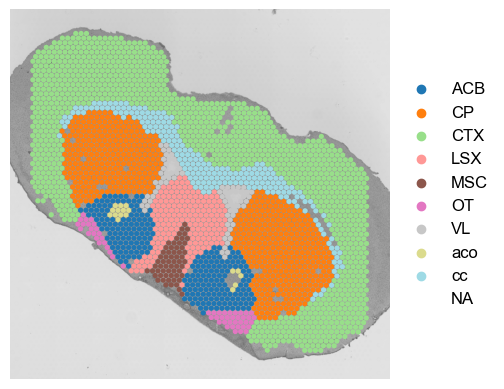

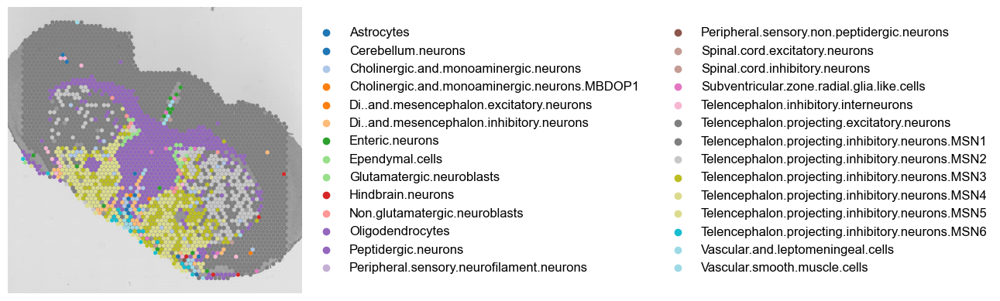

In [11]:
import scanpy as sc
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.titlesize'] = 14  
plt.rcParams['legend.fontsize'] = 12  

# RegionLoupe figure
axs = sc.pl.spatial(
    adata_filtered,
    img_key="hires",
    color="RegionLoupe",
    size=1.5,
    palette='tab20',
    alpha_img=0.6,
    bw=True,
    show=False,
    title=""
)

for ax in axs:
    ax.axis('off')

# plt.savefig('RegionLoupe.svg', format='svg', bbox_inches='tight')
plt.show()

# Cell type figure
axs = sc.pl.spatial(
    adata_filtered,
    img_key="hires",
    color="Cell type",
    size=1.5,
    palette='tab20',
    alpha_img=0.6,
    bw=True,
    show=False,
    title=""
)

for ax in axs:
    ax.axis('off')

plt.savefig('CellType.svg', format='svg', bbox_inches='tight')
plt.show()


# Clustering

## ST latent embedding

/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


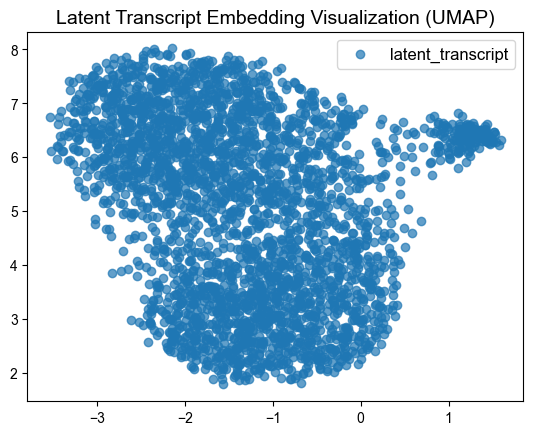

In [12]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction
reduced_latent_transcript_umap = umap_reducer.fit_transform(emb_latent_transcript)

# Plot the UMAP embedding
plt.scatter(
    reduced_latent_transcript_umap[:, 0],
    reduced_latent_transcript_umap[:, 1],
    label="latent_transcript",
    alpha=0.7
)
plt.legend()
plt.title("Latent Transcript Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in adata if needed
adata = adata_filtered
adata.obsm["umap_latent_transcript"] = reduced_latent_transcript_umap


/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/1797426274.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs['umap_based_clusters'] = clusters.astype(str)


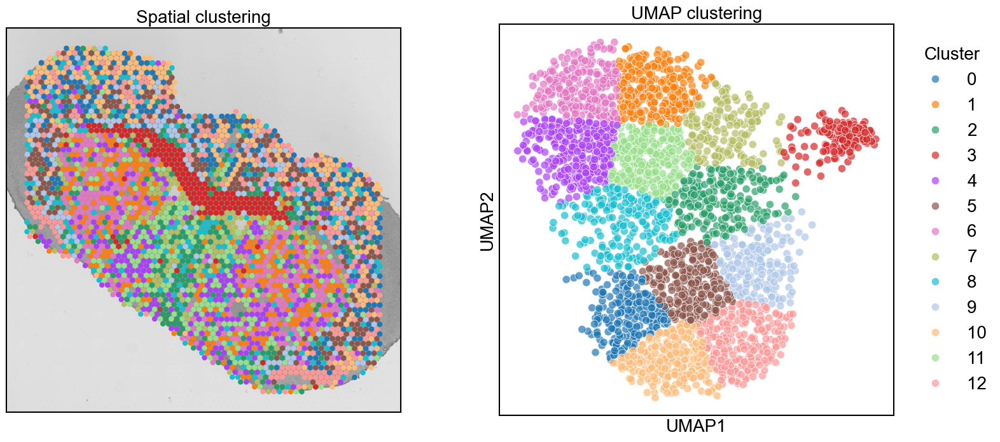

In [13]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13

X = adata.obsm['umap_latent_transcript']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================
sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.savefig(
    'ST_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


In [14]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_latent_transcript"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.366
Calinski-Harabasz Index: 3979.576
Davies-Bouldin Index: 0.798
Region ARI: 0.162, NMI: 0.340
Cell type ARI: 0.155, NMI: 0.334


## SM latent embedding

/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


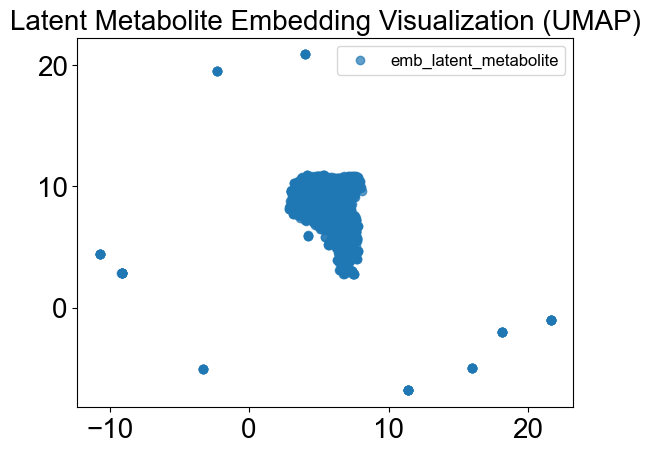

In [15]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction
reduced_latent_metabolite_umap = umap_reducer.fit_transform(emb_latent_metabolite)

# Plot the UMAP embedding
plt.scatter(
    reduced_latent_metabolite_umap[:, 0],
    reduced_latent_metabolite_umap[:, 1],
    label="emb_latent_metabolite",
    alpha=0.7
)
plt.legend()
plt.title("Latent Metabolite Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in adata if needed
adata = adata_filtered
adata.obsm["umap_latent_metabolite"] = reduced_latent_metabolite_umap


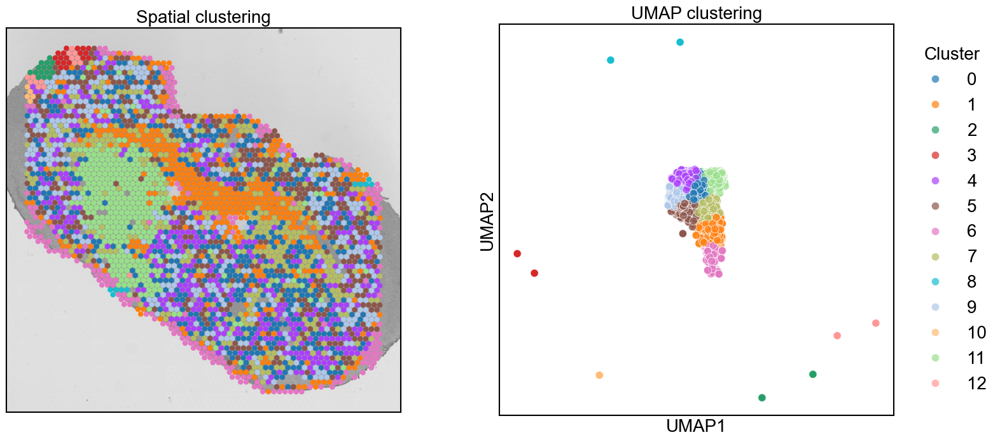

In [16]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13


X = adata.obsm['umap_latent_metabolite']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]


fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================

sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)


plt.savefig(
    'SM_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


In [17]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_latent_metabolite"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.401
Calinski-Harabasz Index: 4585.278
Davies-Bouldin Index: 0.620
Region ARI: 0.060, NMI: 0.126
Cell type ARI: 0.059, NMI: 0.120


## SHINE latent embedding

/Users/dubingxue/opt/anaconda3/envs/shine/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


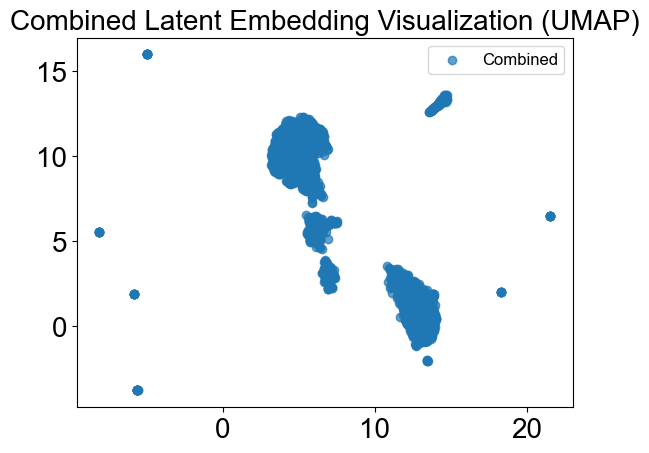

In [18]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction on the combined latent embedding
reduced_combined_umap = umap_reducer.fit_transform(emb_combined)

# Plot the UMAP embedding
plt.scatter(
    reduced_combined_umap[:, 0],
    reduced_combined_umap[:, 1],
    label="Combined",
    alpha=0.7
)
plt.legend()
plt.title("Combined Latent Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in the AnnData object if needed
adata = adata_filtered
adata.obsm["umap_combined"] = reduced_combined_umap


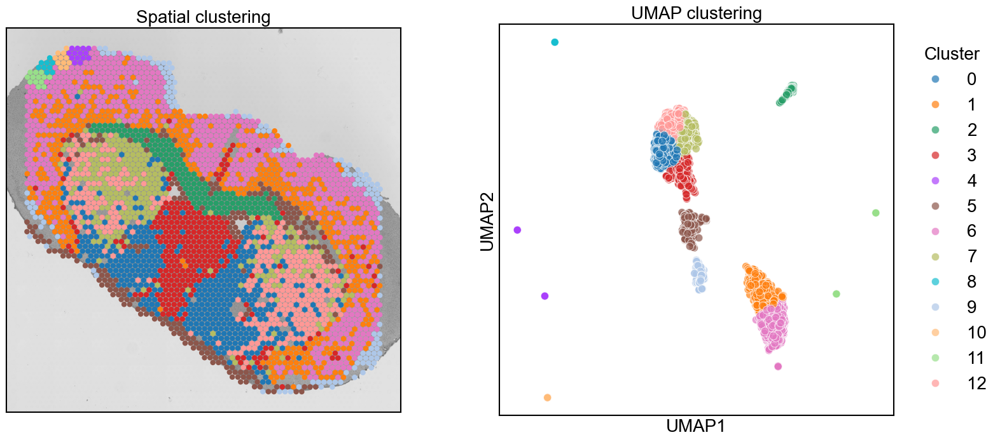

In [19]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13

X = adata.obsm['umap_combined']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================
sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.savefig(
    'SHINE_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2696716107.py:58: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


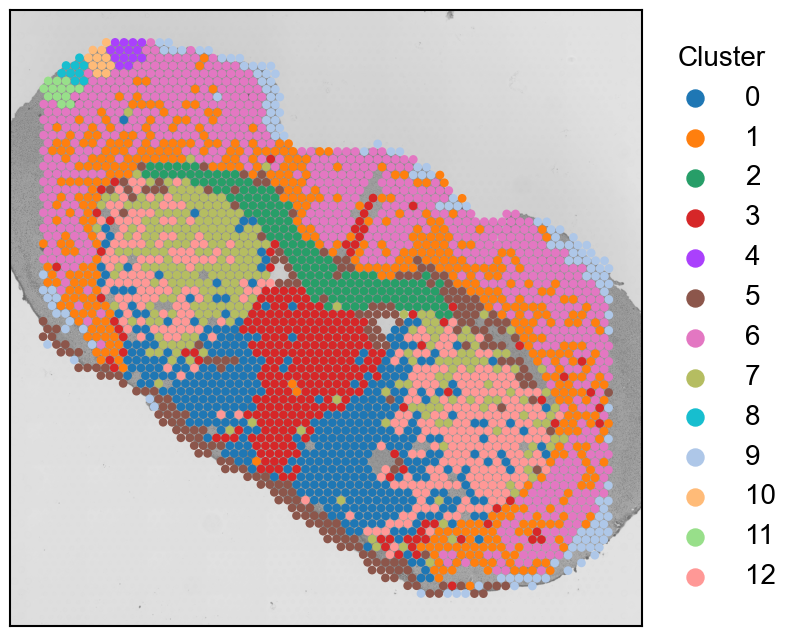

In [20]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Set font family and font sizes
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 20

# Number of clusters
n_clusters = 13

# Perform clustering
X = adata.obsm["umap_combined"]
# kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init="auto")
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs["umap_based_clusters"] = clusters.astype(str)

# Define color palette
palette = sc.pl.palettes.default_20[:n_clusters]

# Create figure and axis
fig, ax = plt.subplots(figsize=(9, 8))

# Spatial visualization with grayscale background and adjusted transparency
sc.pl.spatial(
    adata,
    color="umap_based_clusters",
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=ax,
    show=False,
    legend_loc="right margin",
    legend_fontsize="medium",
    title=""
)

# Remove axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("")

# Draw a clear outer frame
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color("black")

# Manually increase the size of colored dots in the legend
legend = ax.get_legend()
if legend is not None:
    legend.set_title("Cluster")
    legend.get_title().set_fontsize("medium")
    for handle in legend.legendHandles:
        handle.set_sizes([150])  # Increase marker size in the legend

# Save the figure (vector format recommended for publication)
plt.savefig("SHINE.svg", format="svg", bbox_inches="tight")

# Display the figure
plt.show()


In [21]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_combined"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.536
Calinski-Harabasz Index: 17898.619
Davies-Bouldin Index: 0.521
Region ARI: 0.423, NMI: 0.532
Cell type ARI: 0.416, NMI: 0.498


# Downstream Analysis

## Marker genes and metabolites

In [22]:
import pandas as pd
import scanpy as sc

# Assumptions:
# df_genes: spot × genes DataFrame (containing columns: spot, x, y, gene1, gene2, ...)
# df_mets:  spot × metabolites DataFrame (containing columns: spot, x, y, met1, met2, ...)

# Load aligned spatial transcriptomics and metabolomics data
df_genes = pd.read_csv("aligned_ST_data.csv")
df_mets = pd.read_csv("aligned_SM_data.csv")

# Verify that spot identifiers are identical and in the same order
assert (df_genes["spot"] == df_mets["spot"]).all(), "Spot identifiers do not match!"

# Set spot as index for alignment
df_genes.set_index("spot", inplace=True)
df_mets.set_index("spot", inplace=True)

# Remove spatial coordinate columns and keep only expression features
genes_expr = df_genes.drop(columns=["x", "y"])
mets_expr = df_mets.drop(columns=["x", "y"])

# Add a prefix to metabolite feature names for clarity
mets_expr.columns = ["met_" + col for col in mets_expr.columns]

# Concatenate gene and metabolite expression matrices
combined_expr = pd.concat([genes_expr, mets_expr], axis=1)

# Inspect the integrated feature matrix
print(combined_expr.head())

# Update the existing AnnData object
# Assume adata.obs_names are consistent with combined_expr.index
adata = adata[combined_expr.index, :].copy()  # ensure consistent spot ordering

# Replace expression matrix with the integrated features
adata = sc.AnnData(
    X=combined_expr.values,
    obs=adata.obs,
    var=pd.DataFrame(index=combined_expr.columns)
)

# Re-attach spatial coordinates
adata.obs["x"] = df_genes["x"]
adata.obs["y"] = df_genes["y"]

# Optionally recompute basic QC metrics
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Inspect the updated AnnData object
print(adata)


                      Adhfe1  Vxn  1700034P13Rik     Cspp1  Lactb2  Rdh10  \
spot                                                                        
AAACAAGTATCTCCCA-1  0.000000  0.0            0.0  0.000000     0.0    0.0   
AAACATTTCCCGGATT-1  1.042825  0.0            0.0  0.000000     0.0    0.0   
AAACCCGAACGAAATC-1  0.000000  0.0            0.0  0.000000     0.0    0.0   
AAACCGGAAATGTTAA-1  0.000000  0.0            0.0  0.000000     0.0    0.0   
AAACCGGGTAGGTACC-1  0.000000  0.0            0.0  0.762384     0.0    0.0   

                    Gsta3  Phf3  Uggt1  Arid5a  ...  met_1044.29885  \
spot                                            ...                   
AAACAAGTATCTCCCA-1    0.0   0.0    0.0     0.0  ...             0.0   
AAACATTTCCCGGATT-1    0.0   0.0    0.0     0.0  ...             0.0   
AAACCCGAACGAAATC-1    0.0   0.0    0.0     0.0  ...             0.0   
AAACCGGAAATGTTAA-1    0.0   0.0    0.0     0.0  ...             0.0   
AAACCGGGTAGGTACC-1    0.0   0.0   

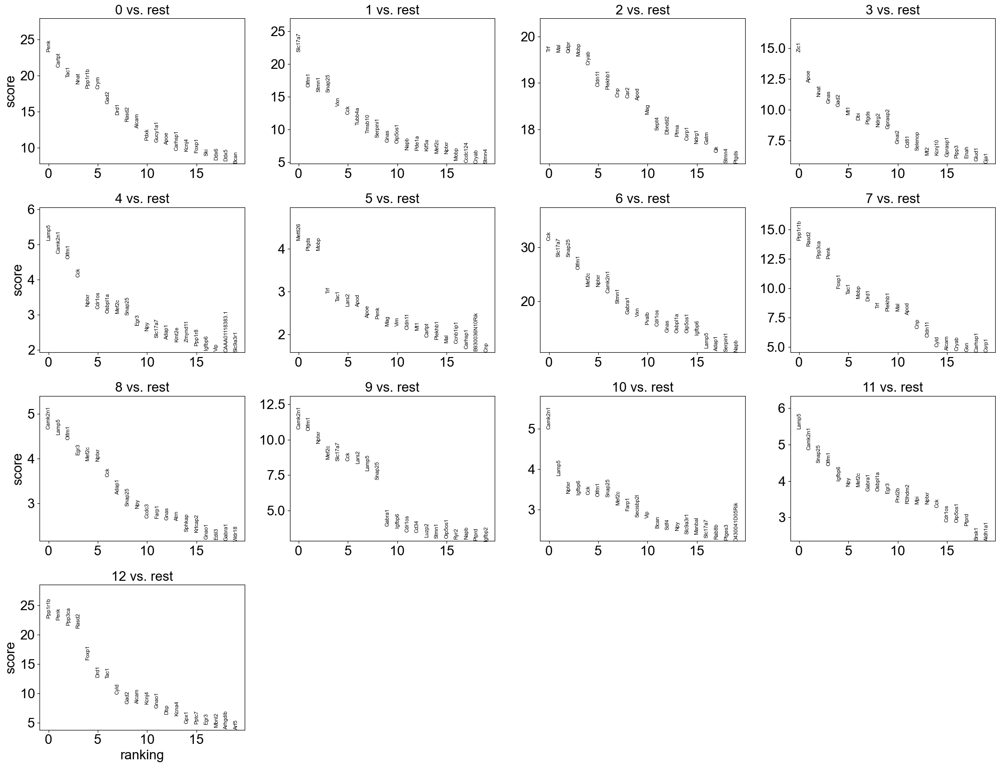

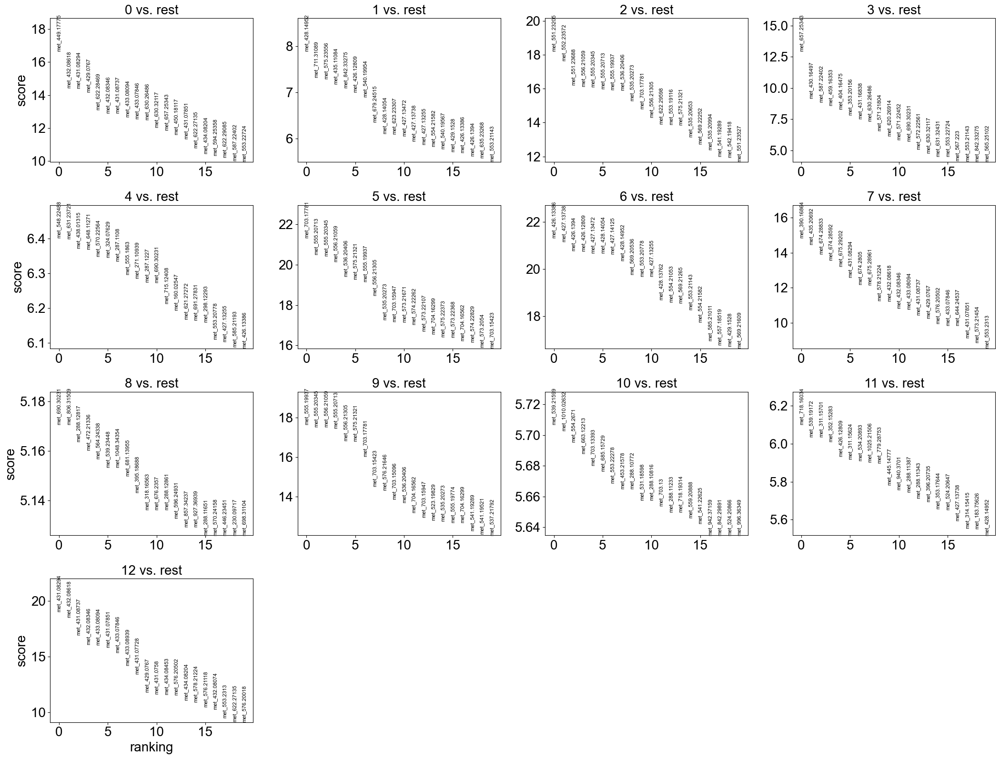

In [23]:

genes_only = adata[:, ~adata.var_names.str.startswith('met_')].copy()
sc.tl.rank_genes_groups(genes_only, 'umap_based_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(genes_only, n_genes=20, title='gene Marker', sharey=False)


metabolites_only = adata[:, adata.var_names.str.startswith('met_')].copy()

sc.tl.rank_genes_groups(metabolites_only, 'umap_based_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(metabolites_only, n_genes=20, title='metabolite Marker', sharey=False)


In [24]:
import pandas as pd

# Extract differential gene expression results
result = genes_only.uns["rank_genes_groups"]

# Specify the cluster of interest
cluster_of_interest = "7"

# Extract marker genes for the selected cluster and rank by FDR (adjusted p-values)
marker_genes = pd.DataFrame({
    "gene": result["names"][cluster_of_interest],
    "pvals_adj": result["pvals_adj"][cluster_of_interest],  # FDR-adjusted p-values
    "logfoldchanges": result["logfoldchanges"][cluster_of_interest],
    "scores": result["scores"][cluster_of_interest],
})

# Sort by FDR and select the top 300 most significant genes
top_marker_genes = marker_genes.sort_values(by="pvals_adj").head(300)

top_marker_genes.reset_index(drop=True, inplace=True)

# Save the full marker gene table to a CSV file
top_marker_genes.to_csv("cluster7_marker_300genes.csv", index=False)

# Alternatively, save only gene names for enrichment analysis
top_marker_genes[["gene"]].to_csv(
    "cluster7_marker_300genes_list.txt",
    index=False,
    header=False
)

# Display the results
print(top_marker_genes)


              gene     pvals_adj  logfoldchanges     scores
0            Olfm1  1.776380e-43       -2.390724 -14.362609
1          Ppp1r1b  8.221596e-42        2.203770  14.045389
2            Rasd2  4.627758e-39        1.969885  13.559703
3             Gnas  6.646113e-34       -1.444488 -12.636449
4           Ppp3ca  1.873057e-33        0.827298  12.537022
..             ...           ...             ...        ...
295        Slc31a2  9.998850e-01       -1.645545  -0.312302
296          Ccnb1  9.998850e-01       -1.405701  -0.312229
297        Slc48a1  9.998850e-01       -0.072320  -0.311568
298           Gatc  9.998850e-01       -0.442914  -0.311532
299  2810459M11Rik  9.998850e-01       -0.391746  -0.310174

[300 rows x 4 columns]


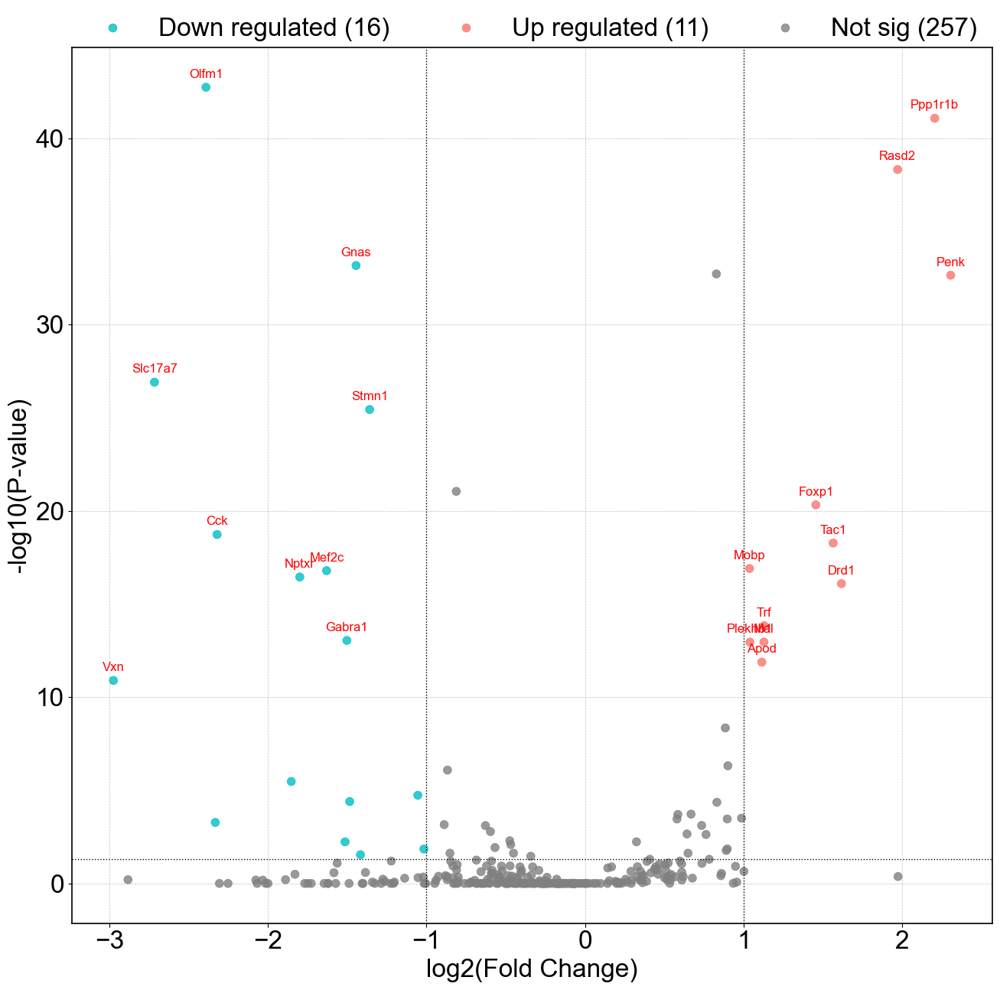

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_genes_cluster7 = pd.read_csv('cluster7_marker_300genes.csv')

# Remove extreme outliers in log fold change
top_marker_genes_cluster7 = top_marker_genes_cluster7[
    (top_marker_genes_cluster7['logfoldchanges'] > -10) &
    (top_marker_genes_cluster7['logfoldchanges'] < 10)
]

# Compute -log10(adjusted p-value)
top_marker_genes_cluster7['neg_log10_padj'] = -np.log10(
    top_marker_genes_cluster7['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_genes_cluster7['significance'] = 'Not sig'
top_marker_genes_cluster7.loc[
    (top_marker_genes_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster7['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_genes_cluster7.loc[
    (top_marker_genes_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster7['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of genes in each category
sig_counts = top_marker_genes_cluster7['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_genes_cluster7,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant genes
# ---------------------------------------------------------
top_genes = top_marker_genes_cluster7[
    (top_marker_genes_cluster7['pvals_adj'] < 0.05) &
    (abs(top_marker_genes_cluster7['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_genes.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['gene'],
        fontsize=12,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano-cluster7-gene.svg', format='svg', bbox_inches='tight')
plt.show()


In [26]:

result = metabolites_only.uns['rank_genes_groups']

# Specify the cluster of interest (e.g., cluster '7')
cluster_of_interest = '7'

# Extract significantly enriched metabolites for the target cluster
# (ranked by p-value by default)
marker_metabolites = pd.DataFrame({
    'metabolite': result['names'][cluster_of_interest],
    # 'pvals': result['pvals'][cluster_of_interest],
    'pvals_adj': result['pvals_adj'][cluster_of_interest],  # FDR-adjusted p-values
    'logfoldchanges': result['logfoldchanges'][cluster_of_interest],
    'scores': result['scores'][cluster_of_interest]
})

# Select the top N significant metabolites
top_marker_metabolites = marker_metabolites.head(300)  # adjust N based on dataset size

# Save full results to file
top_marker_metabolites.to_csv(
    'cluster7_marker_metabolites.csv',
    index=False
)

# Save metabolite names only
top_marker_metabolites[['metabolite']].to_csv(
    'cluster7_marker_metabolite_list.txt',
    index=False,
    header=False
)


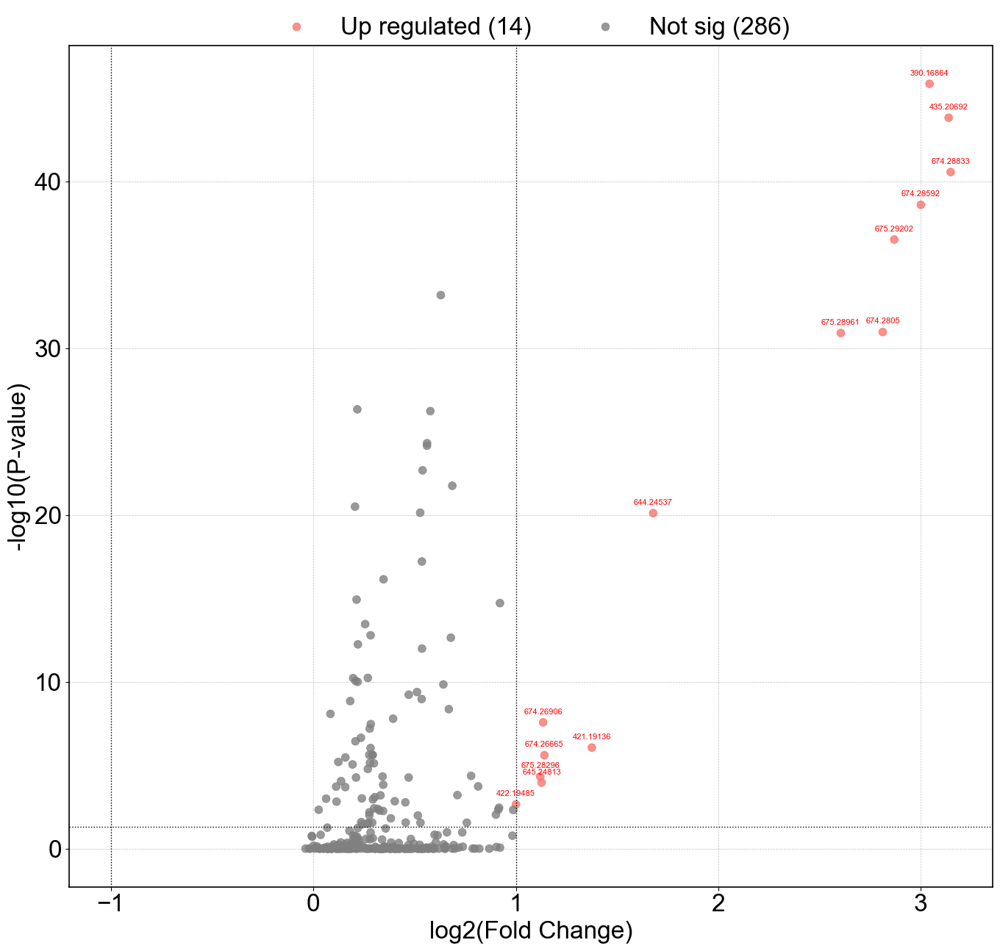

In [27]:
# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_metabolites_cluster7 = pd.read_csv('cluster7_marker_metabolites.csv')

# Remove extreme outliers in log fold change
top_marker_metabolites_cluster7 = top_marker_metabolites_cluster7[
    (top_marker_metabolites_cluster7['logfoldchanges'] > -10) &
    (top_marker_metabolites_cluster7['logfoldchanges'] < 10)
]

# Remove 'met_' prefix from metabolite names
top_marker_metabolites_cluster7['metabolite'] = (
    top_marker_metabolites_cluster7['metabolite']
    .str.replace('^met_', '', regex=True)
)

# Compute -log10(adjusted p-value)
top_marker_metabolites_cluster7['neg_log10_padj'] = -np.log10(
    top_marker_metabolites_cluster7['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_metabolites_cluster7['significance'] = 'Not sig'
top_marker_metabolites_cluster7.loc[
    (top_marker_metabolites_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster7['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_metabolites_cluster7.loc[
    (top_marker_metabolites_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster7['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of metabolites in each category
sig_counts = top_marker_metabolites_cluster7['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_metabolites_cluster7,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant metabolites
# ---------------------------------------------------------
top_metabolites = top_marker_metabolites_cluster7[
    (top_marker_metabolites_cluster7['pvals_adj'] < 0.05) &
    (abs(top_marker_metabolites_cluster7['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_metabolites.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['metabolite'],
        fontsize=8,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano_metabolites_cluster7.svg', format='svg', bbox_inches='tight')
plt.show()


In [28]:
# Extract differential gene expression results
result = genes_only.uns["rank_genes_groups"]

# Specify the cluster of interest
cluster_of_interest = "12"

# Extract marker genes for the selected cluster and rank by FDR (adjusted p-values)
marker_genes = pd.DataFrame({
    "gene": result["names"][cluster_of_interest],
    "pvals_adj": result["pvals_adj"][cluster_of_interest],  # FDR-adjusted p-values
    "logfoldchanges": result["logfoldchanges"][cluster_of_interest],
    "scores": result["scores"][cluster_of_interest],
})

# Sort by FDR and select the top 300 most significant genes
top_marker_genes = marker_genes.sort_values(by="pvals_adj").head(300)

top_marker_genes.reset_index(drop=True, inplace=True)

# Save the full marker gene table to a CSV file
top_marker_genes.to_csv("cluster12_marker_300genes.csv", index=False)

# Alternatively, save only gene names for enrichment analysis
top_marker_genes[["gene"]].to_csv(
    "cluster12_marker_300genes_list.txt",
    index=False,
    header=False
)

# Display the results
print(top_marker_genes)


         gene      pvals_adj  logfoldchanges     scores
0     Ppp1r1b  1.336961e-111        3.129532  22.783489
1        Penk  4.777322e-108        3.670182  22.391365
2      Ppp3ca  5.173539e-100        1.288643  21.532290
3       Rasd2   1.760066e-95        2.711788  21.029545
4       Stmn1   1.897780e-80       -2.500817 -19.306408
..        ...            ...             ...        ...
295      Ddx6   8.638552e-01       -0.193909  -1.522633
296     Acaca   8.646265e-01       -0.607450  -1.520453
297    Zfand6   8.655723e-01       -0.399065  -1.518175
298    Mrps33   8.809732e-01        0.203198   1.506849
299  Tmem132b   8.809732e-01        0.381073   1.505693

[300 rows x 4 columns]


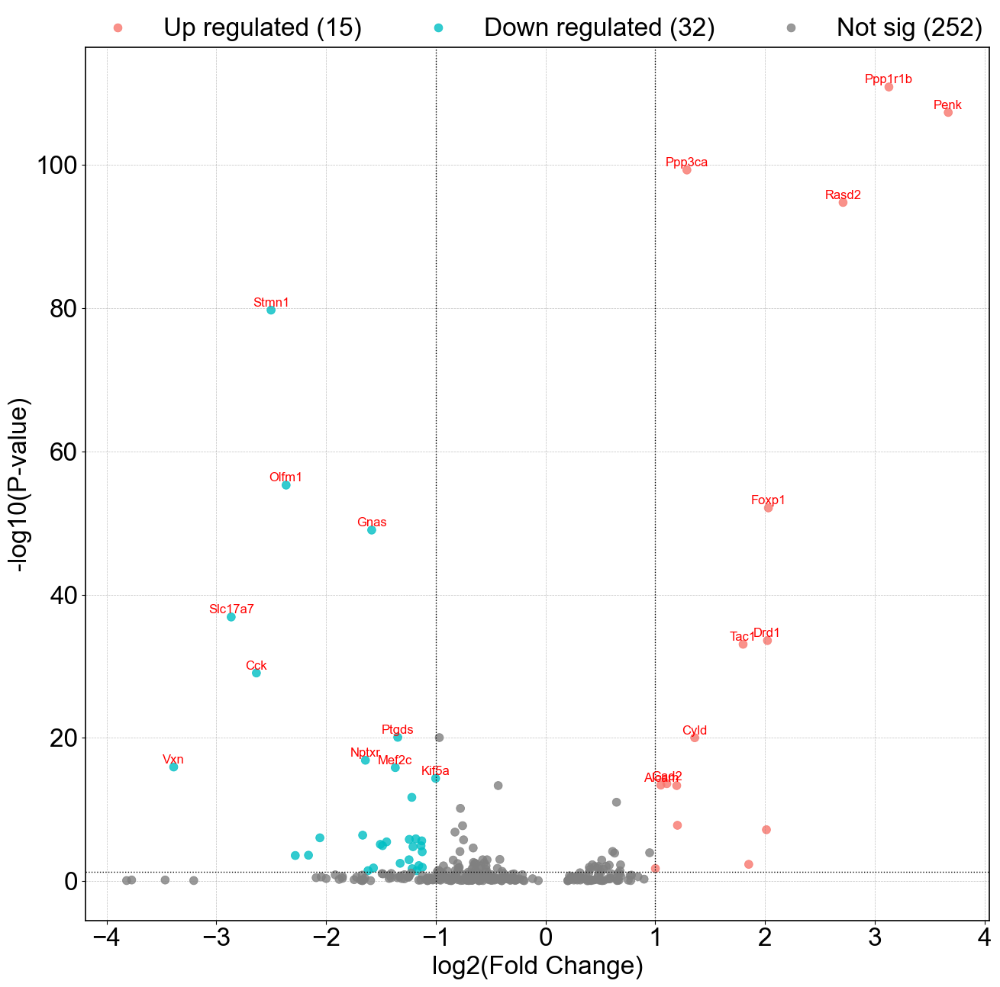

In [29]:
# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_genes_cluster12 = pd.read_csv('cluster12_marker_300genes.csv')

# Remove extreme outliers in log fold change
top_marker_genes_cluster12 = top_marker_genes_cluster12[
    (top_marker_genes_cluster12['logfoldchanges'] > -10) &
    (top_marker_genes_cluster12['logfoldchanges'] < 10)
]

# Compute -log10(adjusted p-value)
top_marker_genes_cluster12['neg_log10_padj'] = -np.log10(
    top_marker_genes_cluster12['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_genes_cluster12['significance'] = 'Not sig'
top_marker_genes_cluster12.loc[
    (top_marker_genes_cluster12['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster12['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_genes_cluster12.loc[
    (top_marker_genes_cluster12['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster12['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of genes in each category
sig_counts = top_marker_genes_cluster12['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_genes_cluster12,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant genes
# ---------------------------------------------------------
top_genes = top_marker_genes_cluster12[
    (top_marker_genes_cluster12['pvals_adj'] < 0.05) &
    (abs(top_marker_genes_cluster12['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_genes.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['gene'],
        fontsize=12,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano-cluster12-gene.svg', format='svg', bbox_inches='tight')
plt.show()


In [30]:
import pandas as pd

# ---------------------------------------------------------
# Extract differential metabolite analysis results
# ---------------------------------------------------------
result = metabolites_only.uns['rank_genes_groups']

# Specify the cluster of interest (e.g., cluster '12')
cluster_of_interest = '12'

# Extract significantly enriched metabolites for the target cluster
# (ranked by p-value by default)
marker_metabolites = pd.DataFrame({
    'metabolite': result['names'][cluster_of_interest],
    # 'pvals': result['pvals'][cluster_of_interest],
    'pvals_adj': result['pvals_adj'][cluster_of_interest],  # FDR-adjusted p-values
    'logfoldchanges': result['logfoldchanges'][cluster_of_interest],
    'scores': result['scores'][cluster_of_interest]
})

# Select the top N significant metabolites
top_marker_metabolites = marker_metabolites.head(300)  # adjust N based on dataset size

# Save full results to file
top_marker_metabolites.to_csv(
    'cluster12_marker_metabolites.csv',
    index=False
)

# Save metabolite names only
top_marker_metabolites[['metabolite']].to_csv(
    'cluster12_marker_metabolite_list.txt',
    index=False,
    header=False
)


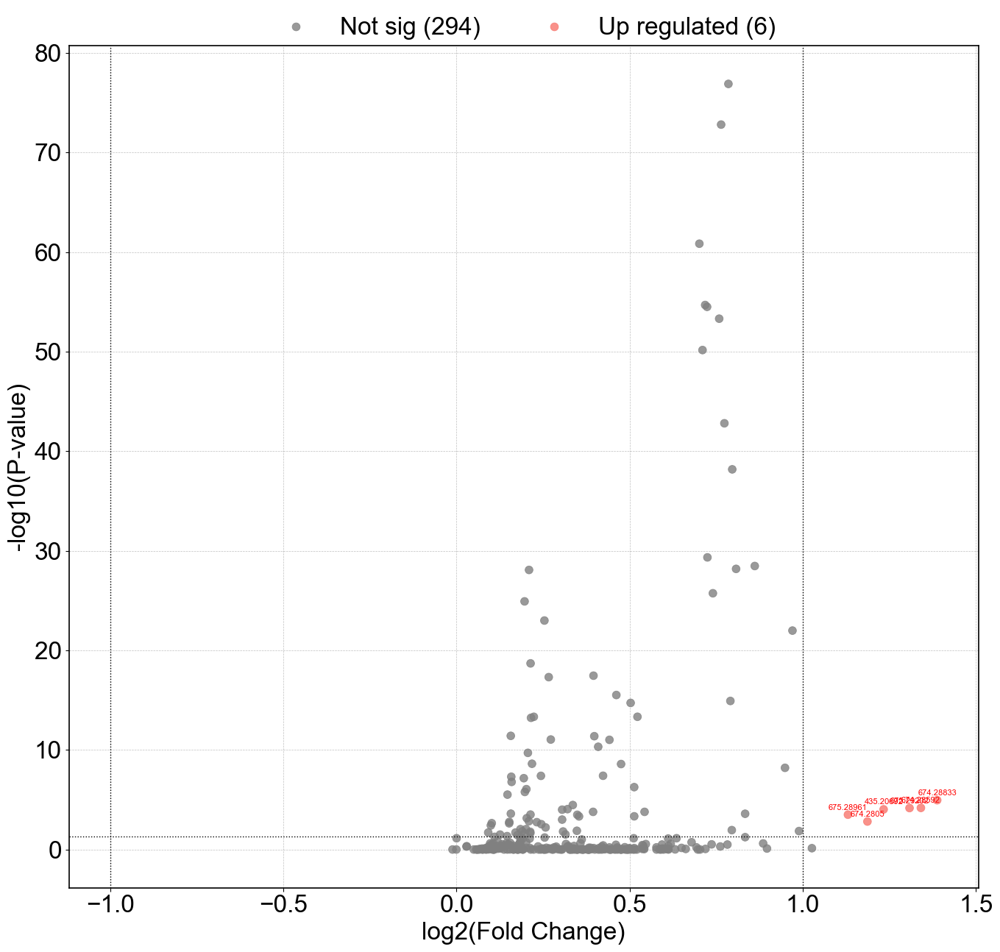

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_metabolites_cluster12 = pd.read_csv('cluster12_marker_metabolites.csv')

# Remove extreme outliers in log fold change
top_marker_metabolites_cluster12 = top_marker_metabolites_cluster12[
    (top_marker_metabolites_cluster12['logfoldchanges'] > -10) &
    (top_marker_metabolites_cluster12['logfoldchanges'] < 10)
]

# Remove 'met_' prefix from metabolite names
top_marker_metabolites_cluster12['metabolite'] = (
    top_marker_metabolites_cluster12['metabolite']
    .str.replace('^met_', '', regex=True)
)

# Compute -log10(adjusted p-value)
top_marker_metabolites_cluster12['neg_log10_padj'] = -np.log10(
    top_marker_metabolites_cluster12['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_metabolites_cluster12['significance'] = 'Not sig'
top_marker_metabolites_cluster12.loc[
    (top_marker_metabolites_cluster12['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster12['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_metabolites_cluster12.loc[
    (top_marker_metabolites_cluster12['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster12['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of metabolites in each category
sig_counts = top_marker_metabolites_cluster12['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_metabolites_cluster12,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant metabolites
# (meeting both p-value and fold-change thresholds)
# ---------------------------------------------------------
top_metabolites = top_marker_metabolites_cluster12[
    (top_marker_metabolites_cluster12['pvals_adj'] < 0.05) &
    (abs(top_marker_metabolites_cluster12['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_metabolites.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['metabolite'],
        fontsize=8,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano_metabolites_cluster12.svg', format='svg', bbox_inches='tight')
plt.show()


## GO Term of Cluster 7 and 12

/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2549804536.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['p.adjust'] = -filtered_df['p.adjust']
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2549804536.py:127: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_yticks_labels, fontsize=16)


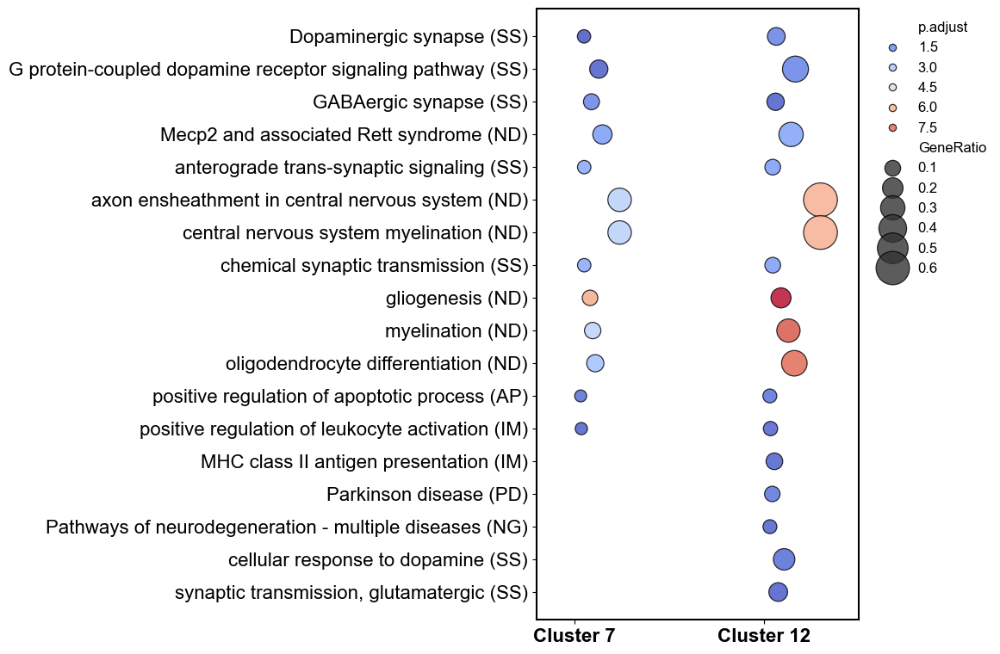

In [32]:
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['font.family'] = 'Arial'

# Enrichment analysis was performed using Metascape
left_df = pd.read_csv('cluster7_top300_enrichement/Enrichment_GO/_FINAL_GO.csv')
right_df = pd.read_csv('cluster12_top300_enrichment/Enrichment_GO/_FINAL_GO.csv')

left_df['Group'] = 'Cluster-7 Left-side'
right_df['Group'] = 'Cluster-12 Right-side 6-OHDA'

cols = ['Description', 'Log(q-value)', 'Enrichment', 'Group']
enrichment_df = pd.concat([left_df[cols], right_df[cols]])

pivot_df = enrichment_df.pivot(index='Description', columns='Group', values=['Log(q-value)', 'Enrichment']).fillna(0)
pivot_df.columns = ['_'.join(col).strip() for col in pivot_df.columns.values]
pivot_df.reset_index(inplace=True)

pivot_df['GeneRatio_Cluster-7'] = pivot_df['Enrichment_Cluster-7 Left-side'] / pivot_df['Enrichment_Cluster-7 Left-side'].max()
pivot_df['GeneRatio_Cluster-12'] = pivot_df['Enrichment_Cluster-12 Right-side 6-OHDA'] / pivot_df['Enrichment_Cluster-12 Right-side 6-OHDA'].max()

pivot_df['abs_diff'] = abs(pivot_df['Log(q-value)_Cluster-12 Right-side 6-OHDA'] - pivot_df['Log(q-value)_Cluster-7 Left-side'])

selected_terms = [
    'Mecp2 and associated Rett syndrome',
    'axon ensheathment in central nervous system',
    'central nervous system myelination',
    'myelination',
    'gliogenesis',
    'oligodendrocyte differentiation',
    'Dopaminergic synapse - Mus musculus (house mouse)',
    'G protein-coupled dopamine receptor signaling pathway',
    'cellular response to dopamine',
    'chemical synaptic transmission',
    'synaptic transmission, glutamatergic',
    'anterograde trans-synaptic signaling',
    'MHC class II antigen presentation',
    'negative regulation of endopeptidase activity',
    'Parkinson disease - Mus musculus (house mouse)',
    'synaptic vesicle cycle',
    'excitatory postsynaptic potential',
    'Gap junction - Mus musculus (house mouse)',
    'GABAergic synapse - Mus musculus (house mouse)',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)',
    'Transmission across Chemical Synapses',
    'cAMP signaling pathway - Mus musculus (house mouse)',
    'Calcium signaling pathway - Mus musculus (house mouse)',
    'positive regulation of leukocyte activation',
    'positive regulation of apoptotic process',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)'
]

pivot_df_selected = pivot_df[pivot_df['Description'].isin(selected_terms)]

long_df_selected = pivot_df_selected.melt(
    id_vars=['Description'],
    value_vars=['GeneRatio_Cluster-7', 'GeneRatio_Cluster-12'],
    var_name='Cluster', value_name='GeneRatio'
)

long_df_selected['p.adjust'] = pivot_df_selected.melt(
    id_vars=['Description'],
    value_vars=['Log(q-value)_Cluster-7 Left-side', 'Log(q-value)_Cluster-12 Right-side 6-OHDA']
)['value']

long_df_selected['Enrichment'] = pivot_df_selected.melt(
    id_vars=['Description'],
    value_vars=['Enrichment_Cluster-7 Left-side', 'Enrichment_Cluster-12 Right-side 6-OHDA']
)['value']

long_df_selected['x_pos'] = long_df_selected.apply(
    lambda x: (0 if 'Cluster-7' in x['Cluster'] else 1) +
    (x['Enrichment']/max(long_df_selected['Enrichment'])*0.3), axis=1
)

term_to_category = {
    'Mecp2 and associated Rett syndrome': 'ND',
    'axon ensheathment in central nervous system': 'ND',
    'central nervous system myelination': 'ND',
    'myelination': 'ND',
    'gliogenesis': 'ND',
    'oligodendrocyte differentiation': 'ND',
    'Dopaminergic synapse - Mus musculus (house mouse)': 'SS',
    'G protein-coupled dopamine receptor signaling pathway': 'SS',
    'cellular response to dopamine': 'SS',
    'chemical synaptic transmission': 'SS',
    'synaptic transmission, glutamatergic': 'SS',
    'anterograde trans-synaptic signaling': 'SS',
    'MHC class II antigen presentation': 'IM',
    'negative regulation of endopeptidase activity': 'PH',
    'Parkinson disease - Mus musculus (house mouse)': 'PD',
    'synaptic vesicle cycle': 'SS',
    'excitatory postsynaptic potential': 'SS',
    'Gap junction - Mus musculus (house mouse)': 'SS',
    'GABAergic synapse - Mus musculus (house mouse)': 'SS',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)': 'SS',
    'Transmission across Chemical Synapses': 'SS',
    'cAMP signaling pathway - Mus musculus (house mouse)': 'CA',
    'Calcium signaling pathway - Mus musculus (house mouse)': 'CA',
    'positive regulation of leukocyte activation': 'IM',
    'positive regulation of apoptotic process': 'AP',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)': 'NG'
}

long_df_selected['Category'] = long_df_selected['Description'].map(term_to_category)
long_df_selected['Description'] = long_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)


fig, ax = plt.subplots(figsize=(12, 8))

filtered_df = long_df_selected[long_df_selected['GeneRatio'] > 0]
filtered_df['p.adjust'] = -filtered_df['p.adjust']

sns.scatterplot(
    data=filtered_df,
    x='x_pos', y='Description',
    size='GeneRatio', hue='p.adjust',
    sizes=(100, 800),
    palette=sns.color_palette("coolwarm", as_cmap=True)
,
    edgecolor='black', alpha=0.8, ax=ax
)

yticks_labels = ax.get_yticklabels()
description_to_category = filtered_df.set_index('Description')['Category'].to_dict()
new_yticks_labels = [f"{label.get_text()} ({description_to_category.get(label.get_text(), '')})" for label in yticks_labels]
ax.set_yticklabels(new_yticks_labels, fontsize=16)

plt.xlim(-0.2, 1.5)
plt.xticks([0, 1], ['Cluster 7', 'Cluster 12'], fontsize=16,fontweight='bold')

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

plt.xlabel('')
plt.ylabel('')

plt.tight_layout(rect=[0, 0, 0.8, 1])  
plt.legend(title='', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
plt.savefig('PD Go Term.svg', format='svg', dpi=300)
plt.tight_layout()
plt.show()

## The Intact and lesioned regions in cluster 7 and 12

In [33]:
import pandas as pd

# ============================================================
# 1) Load lesion annotations and add them to adata.obs
# ============================================================

lesion_df = pd.read_csv(f"{visium_path}/lesion.csv")
lesion_df = lesion_df.rename(columns={"Barcode": "barcode"}).set_index("barcode")
lesion_df = lesion_df[~lesion_df.index.duplicated(keep="first")]

if "lesion" not in lesion_df.columns:
    raise ValueError(
        f"'lesion' column not found in lesion.csv. Available columns: {lesion_df.columns.tolist()}"
    )

# Map lesion status onto spatial barcodes (overwrite if already exists)
adata.obs["lesion"] = adata.obs_names.map(lesion_df["lesion"])

# Standardize lesion labels (lowercase + strip spaces)
adata.obs["lesion"] = (
    adata.obs["lesion"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({"nan": pd.NA})
)

print(f"Missing lesion labels: {adata.obs['lesion'].isna().sum()} / {adata.n_obs}")
print("Lesion label distribution:")
print(adata.obs["lesion"].value_counts(dropna=False))


# ============================================================
# 2) Compute Intact/Lesioned counts for clusters of interest
# ============================================================

clusters_of_interest = ["7", "12"]
cluster_col = "umap_based_clusters"
lesion_col = "lesion"

# Cast cluster labels to string once for reliable comparison
adata.obs[cluster_col] = adata.obs[cluster_col].astype(str)

cluster_lesion_counts = {}

for clu in clusters_of_interest:
    subset = adata.obs.loc[adata.obs[cluster_col] == clu, lesion_col]

    # Count lesion status; missing labels are marked as 'unknown'
    counts = (
        subset.fillna("unknown")
        .value_counts()
        .reindex(["intact", "lesioned", "unknown"], fill_value=0)
        .to_dict()
    )

    # Optional: Present with capitalized keys for nicer printing/plotting
    cluster_lesion_counts[f"Cluster {clu}"] = {
        "Intact": counts.get("intact", 0),
        "Lesioned": counts.get("lesioned", 0),
        "Unknown": counts.get("unknown", 0),
    }

print(cluster_lesion_counts)


# ============================================================
# 3) Sanity checks
# ============================================================

print("\nSanity check: number of spots per cluster of interest")
for clu in clusters_of_interest:
    n_spots = (adata.obs[cluster_col] == clu).sum()
    print(f"Cluster {clu}: {n_spots} spots")

print("\nTop clusters by spot count:")
print(adata.obs[cluster_col].value_counts().head(10))


Missing lesion labels: 0 / 3034
Lesion label distribution:
lesioned    1574
intact      1460
Name: lesion, dtype: int64
{'Cluster 7': {'Intact': 181, 'Lesioned': 84, 'Unknown': 0}, 'Cluster 12': {'Intact': 119, 'Lesioned': 217, 'Unknown': 0}}

Sanity check: number of spots per cluster of interest
Cluster 7: 265 spots
Cluster 12: 336 spots

Top clusters by spot count:
6     685
1     482
0     430
12    336
3     288
7     265
5     224
2     142
9     135
4      14
Name: umap_based_clusters, dtype: int64


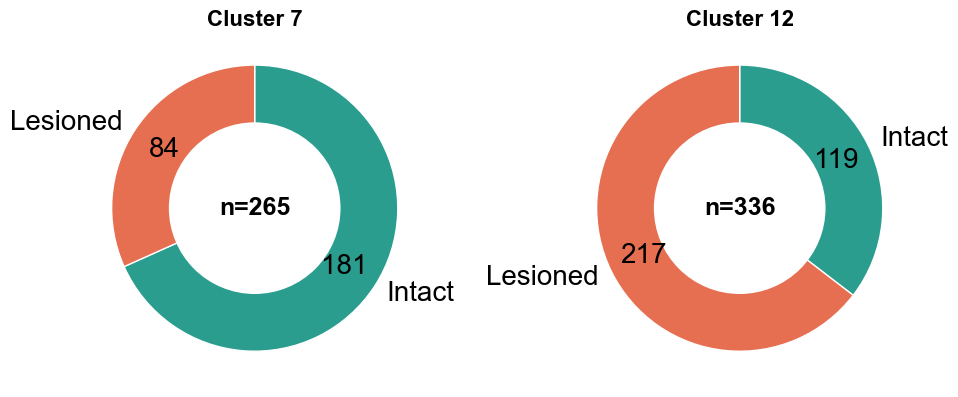

In [34]:
import matplotlib.pyplot as plt

# Data
clusters = {
    "Cluster 7": {"Intact": 181, "Lesioned": 84},
    "Cluster 12": {"Intact": 119, "Lesioned": 217}
}

colors = {"Intact": "#2a9d8f", "Lesioned": "#e76f51"}

fig, axes = plt.subplots(1, len(clusters), figsize=(10, 5))

# Set global font to Arial
plt.rcParams["font.family"] = "Arial"

for ax, (clu, counts) in zip(axes, clusters.items()):
    labels = list(counts.keys())
    sizes = list(counts.values())

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct=lambda p: f"{int(round(p * sum(sizes) / 100.0))}",  # Display absolute counts
        colors=[colors[l] for l in labels],
        startangle=90,
        counterclock=False,
        wedgeprops={"edgecolor": "white"},
        pctdistance=0.75
    )

    # Inner circle to create a donut chart
    centre_circle = plt.Circle((0, 0), 0.6, fc="white")
    ax.add_artist(centre_circle)

    # Display cluster name above each donut
    ax.set_title(clu, fontsize=16, fontweight="bold", family="Arial", pad=2)

    # Display total number of spots in the center
    ax.text(
        0, 0, f"n={sum(sizes)}",
        ha="center", va="center",
        fontsize=18, fontweight="bold", family="Arial"
    )

plt.tight_layout()

# Save figure
plt.savefig("Cluster_donut_counts.svg", format="svg", dpi=300, bbox_inches="tight")

plt.show()


In [40]:
# =========================================================
# 0) Ensure lesion annotation exists in adata.obs
# =========================================================
if "lesion" not in adata.obs.columns:
    print("lesion column not found in adata.obs → loading from lesion.csv")

    import pandas as pd

    lesion_df = pd.read_csv(f"{visium_path}/lesion.csv")
    if "barcode" not in lesion_df.columns and "Barcode" in lesion_df.columns:
        lesion_df = lesion_df.rename(columns={"Barcode": "barcode"})

    lesion_df["barcode"] = lesion_df["barcode"].astype(str).str.strip()
    lesion_df["lesion"] = lesion_df["lesion"].astype(str).str.strip().str.lower()
    lesion_df = lesion_df.drop_duplicates(subset=["barcode"]).set_index("barcode")

    adata.obs["lesion"] = adata.obs_names.astype(str).map(lesion_df["lesion"])

    if adata.obs["lesion"].isna().mean() > 0.5:
        base = adata.obs_names.astype(str).str.replace(r"-1$", "", regex=True)
        adata.obs["lesion"] = base.map(lesion_df["lesion"]).values

print("Lesion labels ready:")
print(adata.obs["lesion"].value_counts(dropna=False).head())

lesion column not found in adata.obs → loading from lesion.csv
Lesion labels ready:
lesioned    1574
intact      1460
Name: lesion, dtype: int64


In [41]:
import re
import numpy as np
import pandas as pd

from sklearn.metrics import roc_auc_score
from scipy.stats import mannwhitneyu, ttest_ind
from statsmodels.stats.multitest import multipletests


# =========================================================
# 0) Merge lesion annotations from adata_combined into adata
#    (index-aligned join on spot barcodes)
# =========================================================
# if 'lesion' in adata.obs.columns:
#     adata.obs = adata.obs.drop(columns=['lesion'])

# adata.obs = adata.obs.join(adata_combined.obs[['lesion']], how='left')


# =========================================================
# 1) Extract latent factor matrix from adata.obs and
#    automatically convert factor indices to 0-based
#
#    - If columns are named latent_combined_1...N,
#      they will be shifted to 0...N-1
#    - Returns:
#        F       : factor matrix (columns = 0-based factor IDs)
#        fac_map : mapping table between raw and 0-based IDs
# =========================================================
def extract_F_from_obs_zero_based(adata, prefix='latent_combined_', auto_shift=True):
    cols = [c for c in adata.obs.columns if c.startswith(prefix)]
    if not cols:
        raise KeyError(f"No factor columns starting with {prefix} found in adata.obs")

    def _raw_id(c):
        mm = re.findall(r'\d+', c)
        if not mm:
            raise ValueError(f"No numeric ID found in column name: {c}")
        return int(mm[-1])

    # Sort columns by their raw factor ID
    cols_sorted = sorted(cols, key=_raw_id)
    raw_ids = np.array([_raw_id(c) for c in cols_sorted], dtype=int)

    # Automatically infer whether factors are 1-based
    shift = 0
    if auto_shift:
        # Common case: IDs start at 1 and do not include 0
        if (0 not in raw_ids) and (raw_ids.min() == 1):
            shift = 1

    factor0 = raw_ids - shift

    # Factor matrix with 0-based factor IDs as columns
    F = adata.obs[cols_sorted].copy()
    F.columns = factor0.tolist()

    # Mapping table: 0-based factor ID -> raw ID / original column name
    fac_map = pd.DataFrame({
        "colname": cols_sorted,
        "raw_id": raw_ids,
        "factor0": factor0
    }).set_index("factor0").sort_index()

    return F, fac_map


F, fac_map = extract_F_from_obs_zero_based(
    adata, prefix='latent_combined_', auto_shift=True
)


# =========================================================
# 2) Factor-level differential analysis within a given cluster
#    (intact vs lesioned)
#
#    - Cohen's d:
#         positive  -> higher in intact
#         negative  -> higher in lesioned
#    - AUROC:
#         standardized to >= 0.5 (discriminative power only)
#    - Statistical test:
#         Mann–Whitney U (Wilcoxon rank-sum) or Welch t-test
#    - Multiple testing correction:
#         Benjamini–Hochberg FDR
#    - Output includes raw factor IDs and column names
#      to avoid index mismatches
# =========================================================
def factor_diff_in_cluster_cohensd(
    adata, F, fac_map, target_cluster,
    cluster_col='umap_based_clusters',
    lesion_col='lesion',
    intact_label='intact',
    lesioned_label='lesioned',
    method="wilcoxon",            # "wilcoxon" or "ttest"
    min_per_group=10,
    eps=1e-12
):
    """
    Perform factor-wise comparison between intact and lesioned
    spots within a specified cluster.

    Returns a DataFrame with columns:
      ['factor','raw_id','colname','cohens_d','auroc','p','q',
       'mean_intact','mean_lesioned','direction',
       'n_intact','n_lesioned']
    """

    # Subset to the target cluster
    mask_c = (adata.obs[cluster_col].astype(str) == str(target_cluster))
    sub_obs = adata.obs.loc[mask_c].copy()
    sub_F = F.loc[sub_obs.index].copy()

    # Keep only intact / lesioned spots
    keep = sub_obs[lesion_col].astype(str).isin([intact_label, lesioned_label])
    sub_obs = sub_obs.loc[keep]
    sub_F = sub_F.loc[keep]

    nI = (sub_obs[lesion_col].astype(str) == intact_label).sum()
    nL = (sub_obs[lesion_col].astype(str) == lesioned_label).sum()
    if (nI < min_per_group) or (nL < min_per_group):
        return None

    # Binary labels for AUROC: 1 = lesioned, 0 = intact
    y = (sub_obs[lesion_col].astype(str) == lesioned_label).astype(int).values

    rows = []
    for j in sub_F.columns:
        v = sub_F[j].values.astype(float)
        v_I = v[y == 0]
        v_L = v[y == 1]

        # Cohen's d (pooled standard deviation)
        mI, mL = float(np.mean(v_I)), float(np.mean(v_L))
        s2I, s2L = float(np.var(v_I, ddof=1)), float(np.var(v_L, ddof=1))
        nI_, nL_ = len(v_I), len(v_L)

        denom = max(nI_ + nL_ - 2, 1)
        s2_pooled = (((nI_ - 1) * s2I) + ((nL_ - 1) * s2L)) / denom
        d = (mI - mL) / np.sqrt(s2_pooled + eps)   # positive: up in intact

        # AUROC (forced to >= 0.5)
        try:
            auc = roc_auc_score(y, v)
        except Exception:
            auc = 0.5
        if auc < 0.5:
            auc = 1 - auc

        # Statistical significance
        try:
            if method == "ttest":
                _, p = ttest_ind(v_I, v_L, equal_var=False)  # Welch's t-test
            else:
                _, p = mannwhitneyu(v_I, v_L, alternative='two-sided')
        except Exception:
            p = 1.0

        direction = 'up_in_intact' if d > 0 else 'up_in_lesioned'

        # Map back to raw factor information
        raw_id = fac_map.loc[j, "raw_id"] if j in fac_map.index else np.nan
        colname = fac_map.loc[j, "colname"] if j in fac_map.index else None

        rows.append((j, raw_id, colname, d, auc, p, mI, mL, direction))

    df = pd.DataFrame(rows, columns=[
        'factor', 'raw_id', 'colname',
        'cohens_d', 'auroc', 'p',
        'mean_intact', 'mean_lesioned', 'direction'
    ])

    # Multiple testing correction
    df['q'] = multipletests(df['p'], method='fdr_bh')[1]
    df['n_intact'] = int(nI)
    df['n_lesioned'] = int(nL)

    df = df.sort_values(['q', 'auroc', 'cohens_d'],
                        ascending=[True, False, False])
    return df


# =========================================================
# 3) Example: run analysis for Cluster 12 and Cluster 7
# =========================================================
for clu in ['12', '7']:
    df_fac = factor_diff_in_cluster_cohensd(
        adata, F, fac_map, target_cluster=clu,
        cluster_col='umap_based_clusters',
        lesion_col='lesion',
        intact_label='intact',
        lesioned_label='lesioned',
        method="wilcoxon",
        min_per_group=10
    )

    if df_fac is None:
        print(f"Cluster {clu}: insufficient samples in one or both groups, skipped")
        continue

    print(f"\nCluster {clu} | Top 10 factors (0-based index; Cohen's d = intact − lesioned)")
    print(df_fac.head(10)[[
        'factor', 'raw_id', 'colname',
        'cohens_d', 'auroc', 'q', 'direction'
    ]])



Cluster 12 | Top 10 factors (0-based index; Cohen's d = intact − lesioned)
     factor  raw_id              colname  cohens_d     auroc             q  \
176     176     176  latent_combined_176 -0.703899  0.707974  7.363990e-08   
230     230     230  latent_combined_230  0.616789  0.696240  3.443825e-07   
159     159     159  latent_combined_159  0.704072  0.690818  6.186560e-07   
68       68      68   latent_combined_68  0.539198  0.685978  1.099564e-06   
105     105     105  latent_combined_105  0.578271  0.679898  2.523744e-06   
126     126     126  latent_combined_126  0.572584  0.672114  7.725811e-06   
134     134     134  latent_combined_134 -0.593499  0.665027  2.065735e-05   
166     166     166  latent_combined_166 -0.502222  0.663517  2.290172e-05   
27       27      27   latent_combined_27 -0.551825  0.662007  2.574070e-05   
188     188     188  latent_combined_188  0.511695  0.659703  3.300924e-05   

          direction  
176  up_in_lesioned  
230    up_in_intact  

In [42]:
import numpy as np
import pandas as pd

# Extract all latent factor columns
factor_cols = [c for c in adata.obs.columns if c.startswith('latent_combined_')]

# Sort columns by numeric suffix to ensure correct order (0,1,2,...)
def _num(c):
    return int(c.split('latent_combined_')[-1])

factor_cols = sorted(factor_cols, key=_num)

# Construct factor matrix (rows = spots, columns = factors)
F = adata.obs[factor_cols].copy()

# Z-score normalization across spots for each factor
# (use ddof=0; protect against zero variance)
Fz = (F - F.mean(axis=0)) / F.std(axis=0, ddof=0).replace(0, 1)

# Extract spatial coordinates aligned with Fz rows
if {'x', 'y'} <= set(adata.obs.columns):
    xy = adata.obs[['x', 'y']].to_numpy()
else:
    # If x/y are stored in adata_combined and share the same index
    xy = adata_combined.obs.loc[adata.obs_names, ['x', 'y']].to_numpy()

# Optional sanity check
print('Fz shape:', Fz.shape, 'xy shape:', xy.shape)


# =========================================================
# 1) Compute Moran’s I for all latent factors (whole section)
# =========================================================
def compute_all_morans(Fz, xy, k=8):
    """
    Compute Moran's I statistic for each latent factor using
    a k-nearest-neighbor spatial graph.

    Parameters
    ----------
    Fz : pandas.DataFrame
        Z-scored factor matrix (spots × factors).
    xy : np.ndarray
        Spatial coordinates (spots × 2).
    k : int
        Number of nearest neighbors used to construct the graph.

    Returns
    -------
    pandas.DataFrame
        DataFrame with columns:
        - 'factor'  : factor index
        - 'moransI' : Moran's I value
    """
    from sklearn.neighbors import kneighbors_graph

    # Binary kNN connectivity matrix
    W = kneighbors_graph(xy, k, mode='connectivity', include_self=False)

    Is = []
    for j in range(Fz.shape[1]):
        v = Fz.iloc[:, j].values
        v0 = v - v.mean()

        num = v0 @ (W @ v0)
        den = (v0 ** 2).sum()

        I = (len(v) / W.sum()) * (num / den)
        Is.append(I)

    return pd.DataFrame({
        'factor': range(Fz.shape[1]),
        'moransI': Is
    })


# Compute Moran's I for all factors
df_moran = compute_all_morans(Fz, xy, k=8)
df_moran_top = df_moran.sort_values('moransI', ascending=False).head(20)
print(df_moran_top)


Fz shape: (3034, 257) xy shape: (3034, 2)
     factor   moransI
166     166  0.816317
180     180  0.787584
196     196  0.784165
47       47  0.766659
119     119  0.763716
72       72  0.756354
53       53  0.745244
246     246  0.741594
191     191  0.735565
188     188  0.728722
236     236  0.727741
221     221  0.718980
51       51  0.708179
7         7  0.697555
245     245  0.681652
254     254  0.677269
128     128  0.670580
58       58  0.668856
253     253  0.666246
50       50  0.665010


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/1345952603.py:68: RuntimeWarning: invalid value encountered in double_scalars
  I = (len(v) / W.sum()) * (num / den)


In [53]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

def plot_volcano_cohensd(
    df, clu,
    q_thresh=0.05, d_thresh=0.2,
    top_n_per_side=5,
    moran_df=None, moran_thresh=None,
    label_size=13, jitter_y=0.20, jitter_x=0.02,
    x_pad=0.06, y_pad=0.6,
    x_shift_left=-0.018,       # global left shift for left-side labels
    min_dy=0.18,              # minimum vertical spacing between left-side labels
    seed=0
):
    rng = np.random.default_rng(seed)

    # ---------------------------------------------------------
    # Merge Moran's I values (if provided)
    # ---------------------------------------------------------
    df_use = df.copy()
    if (moran_df is not None) and ({'factor','moransI'} <= set(moran_df.columns)):
        df_use = df_use.merge(
            moran_df[['factor','moransI']], on='factor', how='left'
        )
    else:
        df_use['moransI'] = np.nan

    # Apply Moran's I threshold if specified
    if moran_thresh is not None:
        df_use = df_use[df_use['moransI'] >= moran_thresh].copy()

    if df_use.empty:
        print(f"[Info] Cluster {clu}: no points after Moran filtering.")
        return

    # ---------------------------------------------------------
    # Compute volcano plot coordinates and significance flags
    # ---------------------------------------------------------
    df_use = df_use.assign(
        x = -df_use['cohens_d'].values,  # Lesioned − Intact
        y = -np.log10(np.clip(df_use['q'].values, 1e-300, 1.0))
    )

    df_use['sig'] = (
        (df_use['q'] < q_thresh) &
        (np.abs(df_use['x']) > d_thresh)
    )
    df_use['side'] = np.where(df_use['x'] > 0, 'lesioned', 'intact')

    # ---------------------------------------------------------
    # Scatter plot
    # ---------------------------------------------------------
    plt.figure(figsize=(7, 6))

    ns = df_use[~df_use['sig']]
    plt.scatter(ns['x'], ns['y'], s=40, c='lightgray',
                alpha=0.5, label='NS')

    upL = df_use[(df_use['sig']) & (df_use['side'] == 'lesioned')]
    upI = df_use[(df_use['sig']) & (df_use['side'] == 'intact')]

    plt.scatter(upL['x'], upL['y'], s=40, c='tomato',
                alpha=0.9, label='Up in Lesioned')
    plt.scatter(upI['x'], upI['y'], s=40, c='royalblue',
                alpha=0.9, label='Up in Intact')

    # ---------------------------------------------------------
    # Threshold lines
    # ---------------------------------------------------------
    plt.axvline(0, color='k', ls='--', lw=1)
    plt.axvline(d_thresh,  color='gray', ls='--', lw=1)
    plt.axvline(-d_thresh, color='gray', ls='--', lw=1)
    plt.axhline(-np.log10(q_thresh), color='gray', ls='--', lw=1)

    # ---------------------------------------------------------
    # Labels: right side (Lesioned) with alternating vertical offsets
    # ---------------------------------------------------------
    subR = (
        upL.sort_values(['q','auroc'], ascending=[True, False])
           .head(top_n_per_side)
           .reset_index(drop=True)
    )

    for i, row in subR.iterrows():
        x0, y0 = row['x'], row['y']
        sign = 1 if (i % 2 == 0) else -1
        y_off = y0 + sign * (jitter_y + (i // 3) * 0.04)
        x_off = x0 + ((-1) ** i) * jitter_x

        plt.text(
            x_off, y_off, str(int(row['factor'])),
            fontsize=label_size, ha='center', va='bottom',
            color='black',
            path_effects=[
                path_effects.Stroke(linewidth=2.2, foreground='white'),
                path_effects.Normal()
            ]
        )

    # ---------------------------------------------------------
    # Labels: left side (Intact) with right alignment and
    # enforced minimum vertical spacing
    # ---------------------------------------------------------
    subL = (
        upI.sort_values(['q','auroc'], ascending=[True, False])
           .head(top_n_per_side)
           .sort_values('y', ascending=False)
           .reset_index(drop=True)
    )

    placed_y = []
    for i, row in subL.iterrows():
        x0, y0 = row['x'], row['y']

        # Initial candidate position with slight vertical jitter
        sign = 1 if (i % 2 == 0) else -1
        y_try = y0 + sign * (jitter_y * 0.6 + (i // 3) * 0.03)

        # Enforce minimum vertical spacing from previously placed labels
        for _ in range(15):
            if all(abs(y_try - yy) >= min_dy for yy in placed_y):
                break
            y_try += 0.05

        placed_y.append(y_try)

        plt.text(
            x0 + x_shift_left, y_try, str(int(row['factor'])),
            fontsize=label_size, ha='right', va='bottom',
            color='black',
            path_effects=[
                path_effects.Stroke(linewidth=2.2, foreground='white'),
                path_effects.Normal()
            ]
        )

    # ---------------------------------------------------------
    # Axis limits and layout
    # ---------------------------------------------------------
    xmin, xmax = df_use['x'].min(), df_use['x'].max()
    ymin, ymax = df_use['y'].min(), df_use['y'].max()

    plt.xlim(xmin - x_pad, xmax + x_pad)
    plt.ylim(0, ymax + y_pad)

    title = f"Differential Factors in Cluster {clu}"
    if moran_thresh is not None:
        title += f"  (Moran’s I ≥ {moran_thresh})"

    plt.title(title)
    plt.xlabel("Cohen's d (Lesioned − Intact)")
    plt.ylabel("−log10(FDR)")
    plt.legend(frameon=False)

    plt.tight_layout()
    plt.savefig(
        f"Cluster_{clu}_volcano_moran_labeled.svg",
        format="svg", dpi=300, bbox_inches="tight"
    )
    plt.show()


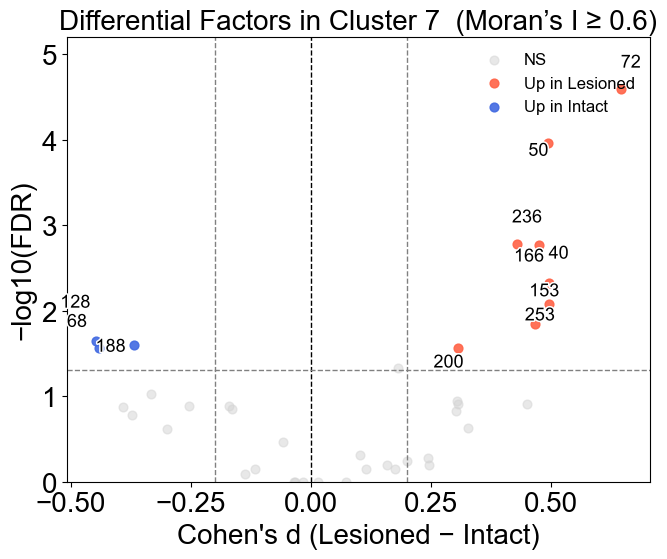

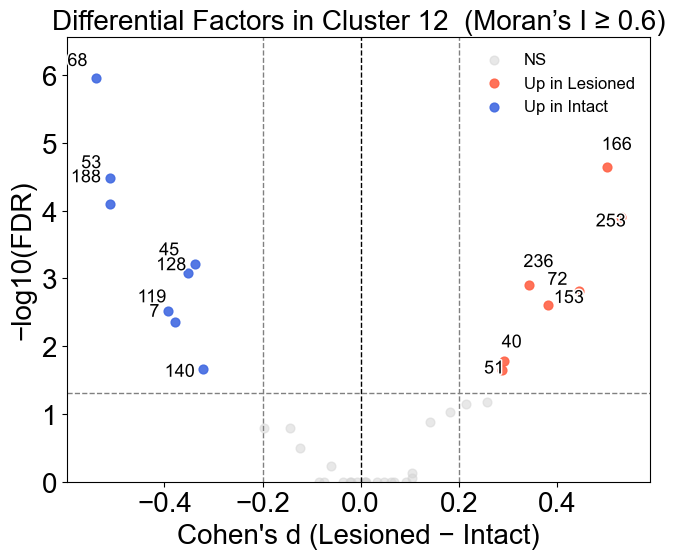

In [54]:
import re

def factor_to_int(x):
    m = re.search(r"(\d+)$", str(x))
    if m is None:
        return np.nan
    return int(m.group(1))

df_moran_use = df_moran.copy()

if df_moran_use['factor'].dtype != object:
    df_moran_use['factor'] = df_moran_use['factor'].astype(int)

if df_moran_use['factor'].max() < len(factor_cols):
    df_moran_use['factor'] = df_moran_use['factor'].map(
        lambda pos: factor_to_int(factor_cols[int(pos)])
    )

# Drop factors that failed to parse
df_moran_use = df_moran_use.dropna(subset=["factor"])
df_moran_use["factor"] = df_moran_use["factor"].astype(int)

# ------------------------------------------------------------
# 1) Run per-cluster factor differential analysis and volcano plot
# ------------------------------------------------------------
for clu in ['7', '12']:
    df_fac = factor_diff_in_cluster_cohensd(
        adata, F, fac_map, target_cluster=clu,
        lesion_col='lesion', intact_label='intact', lesioned_label='lesioned'
    )
    if df_fac is None or df_fac.empty:
        print(f"Cluster {clu}: df_fac empty, skip")
        continue

    # Convert factor labels to integer IDs (matches df_moran_use['factor'])
    df_fac["factor"] = df_fac["factor"].map(factor_to_int)
    df_fac = df_fac.dropna(subset=["factor"])
    df_fac["factor"] = df_fac["factor"].astype(int)

    plot_volcano_cohensd(
        df_fac, clu,
        q_thresh=0.05, d_thresh=0.2,
        top_n_per_side=10,
        moran_df=df_moran_use,
        moran_thresh=0.6
    )


## Factor 72 & 166

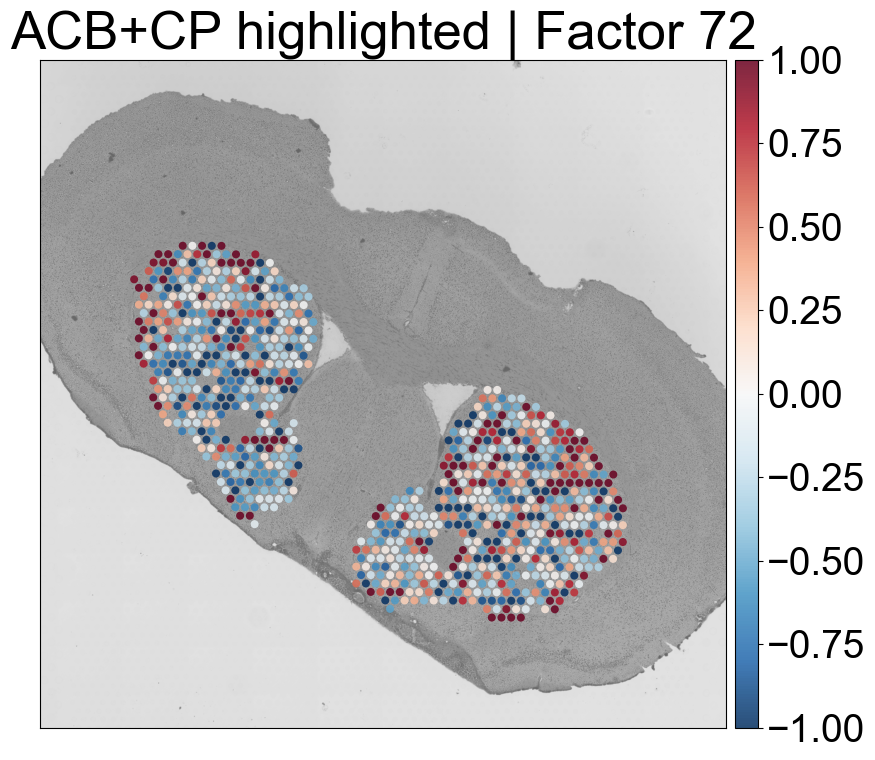

In [69]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# -----------------------------
# Settings
# -----------------------------
factor_idx = 72
region_col = "RegionLoupe"
keep_regions = ["ACB", "CP"]

# -----------------------------
# 1) Raw latent values
# -----------------------------
raw = adata_filtered.obs[f'latent_combined_{factor_idx}'].astype(float)

# -----------------------------
# 2) Mask ACB + CP
# -----------------------------
mask = adata_filtered.obs[region_col].isin(keep_regions)
r = raw[mask].values

# -----------------------------
# 3) Quantile normalization (ACB+CP only)
# -----------------------------
q1, q2 = np.percentile(r, [10, 90])
z = (raw - q1) / (q2 - q1 + 1e-8)
z = np.clip(z, 0, 1) * 2 - 1   # -> [-1, 1]

plot_key = f'latent_{factor_idx}_qnorm'
adata_filtered.obs[plot_key] = np.nan
adata_filtered.obs.loc[mask, plot_key] = z.loc[mask].values

# -----------------------------
# 4) Plot
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 8))
sc.pl.spatial(
    adata_filtered,
    color=plot_key,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    na_color=(0, 0, 0, 0),
    img_key='hires',
    bw=True,
    alpha_img=0.6,
    size=4.0,
    spot_size=120,
    alpha=0.85,
    ax=ax,
    show=False,
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=28)  
ax.set_title("ACB+CP highlighted | Factor 72",fontsize=38,fontname='Arial')
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(f"Factor_{factor_idx}_ACB+CP_spatial.svg", format="svg", dpi=300, bbox_inches="tight")  # 保存
plt.show()



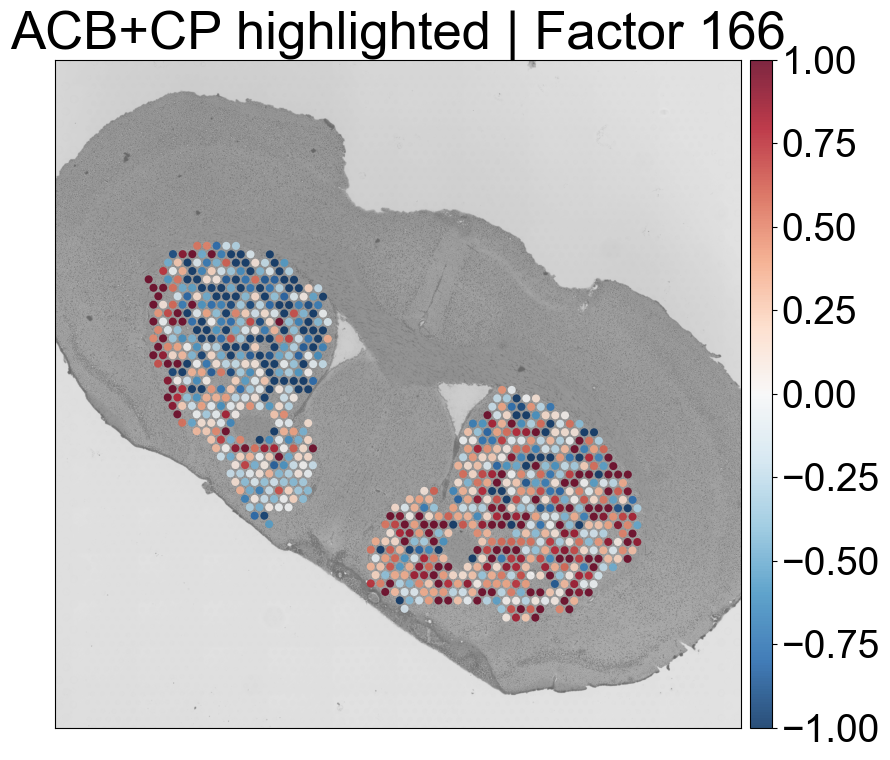

In [70]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# -----------------------------
# Settings
# -----------------------------
factor_idx = 166
region_col = "RegionLoupe"
keep_regions = ["ACB", "CP"]

# -----------------------------
# 1) Raw latent values
# -----------------------------
raw = adata_filtered.obs[f'latent_combined_{factor_idx}'].astype(float)

# -----------------------------
# 2) Mask ACB + CP
# -----------------------------
mask = adata_filtered.obs[region_col].isin(keep_regions)
r = raw[mask].values

# -----------------------------
# 3) Quantile normalization (same as Factor 72 for comparability)
# -----------------------------
q1, q2 = np.percentile(r, [10, 90])
z = (raw - q1) / (q2 - q1 + 1e-8)
z = np.clip(z, 0, 1) * 2 - 1

plot_key = f'latent_{factor_idx}_qnorm'
adata_filtered.obs[plot_key] = np.nan
adata_filtered.obs.loc[mask, plot_key] = z.loc[mask].values

# -----------------------------
# 4) Plot
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 8))
sc.pl.spatial(
    adata_filtered,
    color=plot_key,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    na_color=(0, 0, 0, 0),
    img_key='hires',
    bw=True,
    alpha_img=0.6,
    size=4.0,
    spot_size=120,
    alpha=0.85,
    ax=ax,
    show=False,
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=28)  
ax.set_title("ACB+CP highlighted | Factor 166",fontsize=38,fontname='Arial')
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(f"Factor_{factor_idx}_ACB+CP_spatial.svg", format="svg", dpi=300, bbox_inches="tight")  # 保存
plt.show()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2513513129.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2513513129.py:15: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


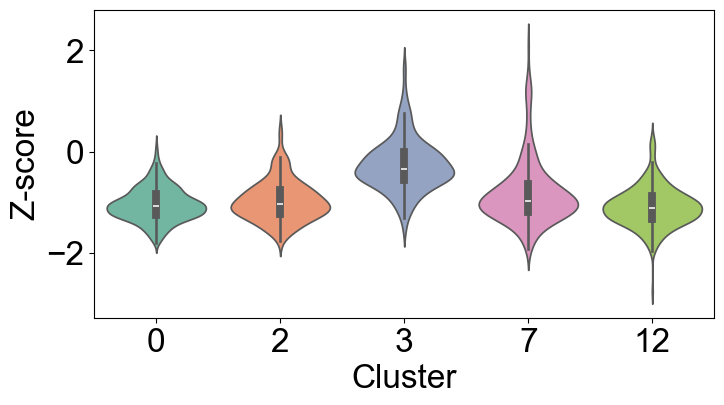

In [75]:
clusters_arr = adata.obs["umap_based_clusters"].astype(str).values

def violin_for_factor(Fz, clusters, factor_id, clusters_order=None):
    vals = Fz.iloc[:, factor_id].values

    df = pd.DataFrame({
        "Cluster": clusters.astype(str),
        "Value": vals
    })

    if clusters_order is None:
        clusters_order = sorted(df["Cluster"].unique(), key=lambda x: int(x))

    plt.figure(figsize=(8, 4))
    sns.violinplot(
        x="Cluster",
        y="Value",
        data=df,
        order=clusters_order,
        inner="box",
        scale="width",
        palette="Set2"
    )


    plt.ylabel("Z-score", fontsize=24)
    plt.xlabel("Cluster", fontsize=24)

    plt.xticks(fontsize=24)
    plt.yticks(fontsize=24)

    plt.savefig(
        f"Factor{factor_id}fz.svg",
        format="svg",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

violin_for_factor(
    Fz,
    clusters_arr,
    factor_id=72,
    clusters_order=["0", "2", "3", "7", "12"]
)


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2513513129.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2513513129.py:15: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


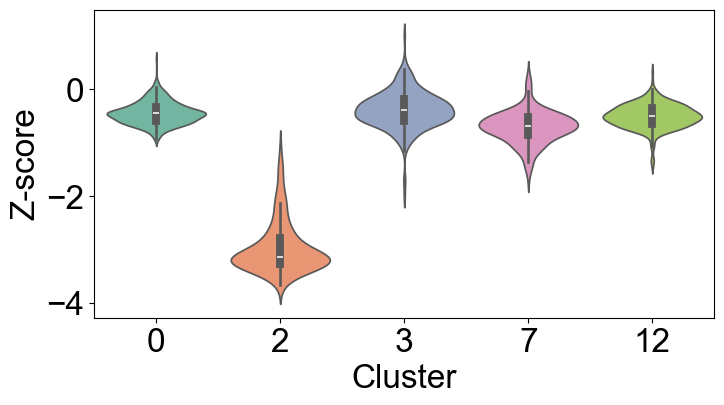

In [76]:
violin_for_factor(
    Fz,
    clusters_arr,
    factor_id=166,
    clusters_order=["0", "2", "3", "7", "12"]
)

In [77]:
gene_corr_results = []

top_factors = [72, 166]   

for factor_idx in top_factors:
    factor_scores = emb_combined[:, factor_idx]
    for gene in transcript_expr.columns:
        gene_expr = transcript_expr[gene].values
        if np.any(gene_expr):  
            corr, p_value = spearmanr(factor_scores, gene_expr)
            gene_corr_results.append({
                'Factor': f'{factor_idx}',
                'Gene': gene,
                'Correlation': corr,
                'P_value': p_value
            })

gene_corr_df = pd.DataFrame(gene_corr_results)

# FDR correction (Benjamini–Hochberg)
_, gene_corr_df['FDR'], _, _ = multipletests(
    gene_corr_df['P_value'], method='fdr_bh'
)

gene_corr_df.head()


,Factor,Gene,Correlation,P_value,FDR
0,72,Adhfe1,-0.044932,1.331763e-02,3.333575e-02
1,72,Vxn,0.422861,6.758933e-132,1.126489e-129
2,72,1700034P13Rik,0.007349,6.857278e-01,7.884194e-01
3,72,Cspp1,-0.075512,3.133420e-05,1.440653e-04
4,72,Lactb2,-0.045723,1.177600e-02,2.997546e-02


In [78]:
met_corr_results = []

for factor_idx in top_factors:
    factor_scores = emb_combined[:, factor_idx]

    for metabolite in metabolite_abundance.columns:
        met_values = metabolite_abundance[metabolite].values

        # Skip metabolites with all-zero abundance
        if np.any(met_values):
            corr, p_value = spearmanr(factor_scores, met_values)

            met_corr_results.append({
                'Factor': factor_idx,        
                'Metabolite': metabolite,
                'Correlation': corr,
                'P_value': p_value
            })

# Convert to DataFrame
met_corr_df = pd.DataFrame(met_corr_results)

# FDR correction (Benjamini–Hochberg)
_, met_corr_df['FDR'], _, _ = multipletests(
    met_corr_df['P_value'], method='fdr_bh'
)

met_corr_df.head()


,Factor,Metabolite,Correlation,P_value,FDR
0,72,156.26059,0.000153,0.993270,0.995860
1,72,156.26195,-0.007921,0.662741,0.822345
2,72,156.48344,0.009657,0.594918,0.779108
3,72,156.4838,0.010077,0.578989,0.768322
4,72,156.485,0.012722,0.483626,0.691571


In [79]:
# ---------------------------------------------------------
# Convert results to DataFrame
# ---------------------------------------------------------
gene_corr_df = pd.DataFrame(gene_corr_results)

# ---------------------------------------------------------
# Multiple testing correction (Benjamini–Hochberg FDR)
# ---------------------------------------------------------
_, gene_corr_df['FDR'], _, _ = multipletests(
    gene_corr_df['P_value'], method='fdr_bh'
)

gene_corr_df['Factor'] = gene_corr_df['Factor'].astype(str)

for factor_idx in ['72', '166']:
    # Subset results for the current factor
    df_factor = gene_corr_df[gene_corr_df['Factor'] == factor_idx].copy()

    # Sort by FDR (ascending) and select top 300 genes
    top300_genes = (
        df_factor
        .sort_values('FDR', ascending=True)
        .head(300)
    )

    # Save to CSV
    out_file = f'Factor{factor_idx}_top300_genes_byFDR.csv'
    top300_genes.to_csv(out_file, index=False)

    print(f"Saved {out_file}: {top300_genes.shape[0]} genes")


Saved Factor72_top300_genes_byFDR.csv: 300 genes
Saved Factor166_top300_genes_byFDR.csv: 300 genes


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2031959123.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2031959123.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)
/var/folders/ly/l_ycn3sd0jg

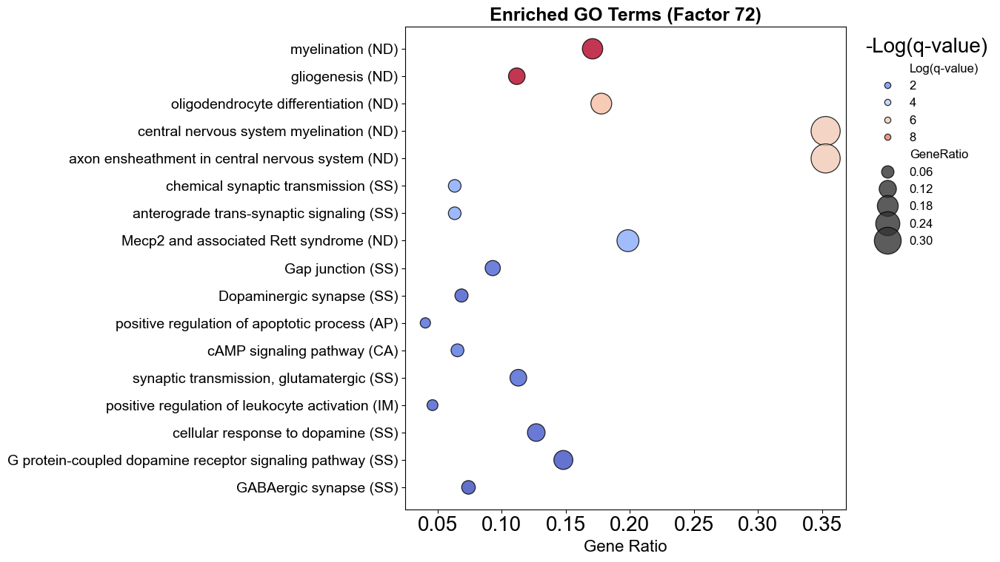

In [80]:
mpl.rcParams['font.family'] = 'Arial'

overall_df = pd.read_csv('top300_genes_Factor72_overall_enrichment/Enrichment_GO/_FINAL_GO.csv')

overall_df = overall_df[['Description', 'Log(q-value)', 'Enrichment']].copy()

overall_df['GeneRatio'] = overall_df['Enrichment'] / overall_df['Enrichment'].max()


selected_terms = [
    'Mecp2 and associated Rett syndrome',
    'axon ensheathment in central nervous system',
    'central nervous system myelination',
    'myelination',
    'gliogenesis',
    'oligodendrocyte differentiation',
    'Dopaminergic synapse - Mus musculus (house mouse)',
    'G protein-coupled dopamine receptor signaling pathway',
    'cellular response to dopamine',
    'chemical synaptic transmission',
    'synaptic transmission, glutamatergic',
    'anterograde trans-synaptic signaling',
    'MHC class II antigen presentation',
    'negative regulation of endopeptidase activity',
    'Parkinson disease - Mus musculus (house mouse)',
    'synaptic vesicle cycle',
    'excitatory postsynaptic potential',
    'Gap junction - Mus musculus (house mouse)',
    'GABAergic synapse - Mus musculus (house mouse)',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)',
    'Transmission across Chemical Synapses',
    'cAMP signaling pathway - Mus musculus (house mouse)',
    'Calcium signaling pathway - Mus musculus (house mouse)',
    'positive regulation of leukocyte activation',
    'positive regulation of apoptotic process',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)'
]

overall_df_selected = overall_df[overall_df['Description'].isin(selected_terms)]

term_to_category = {
    'Mecp2 and associated Rett syndrome': 'ND',
    'axon ensheathment in central nervous system': 'ND',
    'central nervous system myelination': 'ND',
    'myelination': 'ND',
    'gliogenesis': 'ND',
    'oligodendrocyte differentiation': 'ND',
    'Dopaminergic synapse - Mus musculus (house mouse)': 'SS',
    'G protein-coupled dopamine receptor signaling pathway': 'SS',
    'cellular response to dopamine': 'SS',
    'chemical synaptic transmission': 'SS',
    'synaptic transmission, glutamatergic': 'SS',
    'anterograde trans-synaptic signaling': 'SS',
    'MHC class II antigen presentation': 'IM',
    'negative regulation of endopeptidase activity': 'PH',
    'Parkinson disease - Mus musculus (house mouse)': 'PD',
    'synaptic vesicle cycle': 'SS',
    'excitatory postsynaptic potential': 'SS',
    'Gap junction - Mus musculus (house mouse)': 'SS',
    'GABAergic synapse - Mus musculus (house mouse)': 'SS',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)': 'SS',
    'Transmission across Chemical Synapses': 'SS',
    'cAMP signaling pathway - Mus musculus (house mouse)': 'CA',
    'Calcium signaling pathway - Mus musculus (house mouse)': 'CA',
    'positive regulation of leukocyte activation': 'IM',
    'positive regulation of apoptotic process': 'AP',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)': 'NG'
}

overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)


fig, ax = plt.subplots(figsize=(14, 8))

sns.scatterplot(
    data=overall_df_selected,
    x='GeneRatio', y='Description',
    size='GeneRatio', hue=-overall_df_selected['Log(q-value)'],
    sizes=(100, 800),
    palette=sns.color_palette("coolwarm", as_cmap=True),
    edgecolor='black', alpha=0.8, ax=ax
)

yticks_labels = ax.get_yticklabels()
description_to_category = overall_df_selected.set_index('Description')['Category'].to_dict()
new_yticks_labels = [f"{label.get_text()} ({description_to_category.get(label.get_text(), '')})" for label in yticks_labels]
ax.set_yticklabels(new_yticks_labels, fontsize=14)

plt.xlabel('Gene Ratio', fontsize=16)
plt.ylabel('')
plt.title('Enriched GO Terms (Factor 72)', fontsize=18, fontweight='bold')


plt.legend(title='-Log(q-value)', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)

plt.tight_layout()
plt.savefig('Factor72_overall_GO.svg', format='svg', bbox_inches='tight')

plt.show()


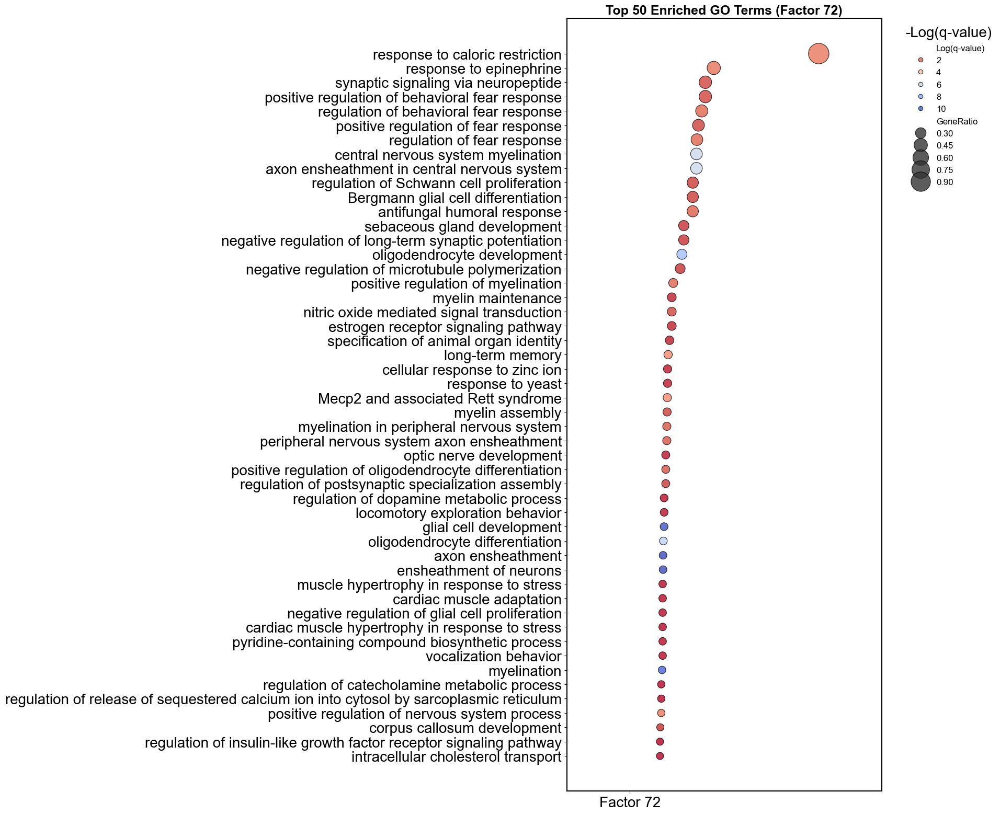

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Arial'

overall_df = pd.read_csv('top300_genes_Factor72_overall_enrichment/Enrichment_GO/_FINAL_GO.csv')

overall_df = overall_df[['Description', 'Log(q-value)', 'Enrichment']].copy()

overall_df['GeneRatio'] = overall_df['Enrichment'] / overall_df['Enrichment'].max()

overall_df = overall_df.sort_values('Enrichment', ascending=False).head(50)

long_df = overall_df.copy()
long_df['x_pos'] = long_df['Enrichment'] / overall_df['Enrichment'].max() * 0.3

plt.figure(figsize=(20, 16))
ax = sns.scatterplot(
    data=long_df,
    x='x_pos', y='Description',
    size='GeneRatio', hue=-long_df['Log(q-value)'],
    sizes=(100, 800), palette='coolwarm_r', edgecolor='black', alpha=0.8
)

plt.xlim(-0.1, 0.4)
plt.xticks([0], ['Factor 72'])

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)


plt.xlabel('', fontsize=16, fontweight='bold')
plt.ylabel('')
plt.title('Top 50 Enriched GO Terms (Factor 72)', fontsize=18, fontweight='bold')


plt.legend(title='-Log(q-value)', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

plt.tight_layout()
plt.savefig('Factor72_Overall_Top50_GO.svg', format='svg', bbox_inches='tight')

plt.show()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2022491512.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2022491512.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)
/var/folders/ly/l_ycn3sd0jg

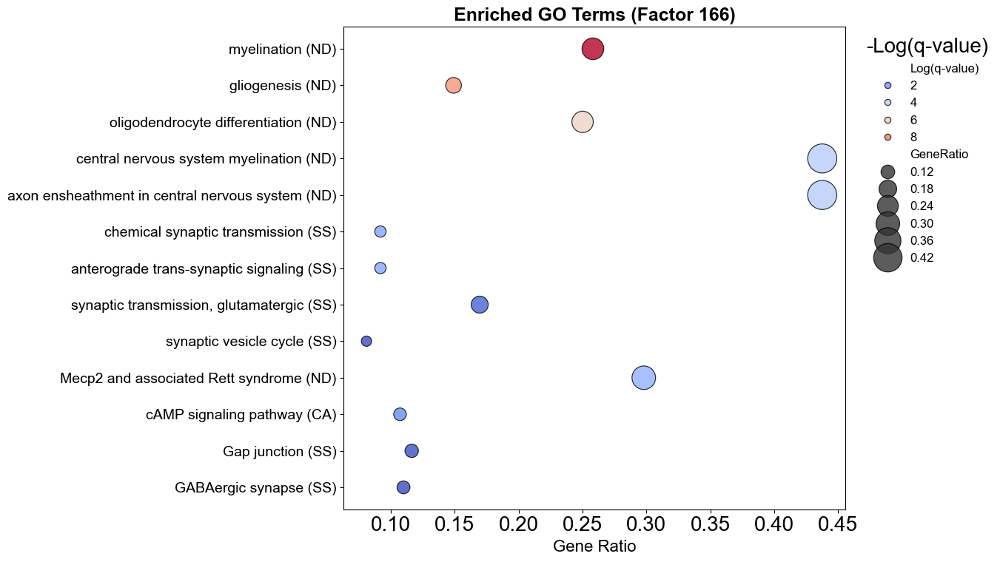

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Arial'

overall_df = pd.read_csv('top300_genes_Factor166_overall_enrichment/Enrichment_GO/_FINAL_GO.csv')

overall_df = overall_df[['Description', 'Log(q-value)', 'Enrichment']].copy()

overall_df['GeneRatio'] = overall_df['Enrichment'] / overall_df['Enrichment'].max()

selected_terms = [
    'Mecp2 and associated Rett syndrome',
    'axon ensheathment in central nervous system',
    'central nervous system myelination',
    'myelination',
    'gliogenesis',
    'oligodendrocyte differentiation',
    'Dopaminergic synapse - Mus musculus (house mouse)',
    'G protein-coupled dopamine receptor signaling pathway',
    'cellular response to dopamine',
    'chemical synaptic transmission',
    'synaptic transmission, glutamatergic',
    'anterograde trans-synaptic signaling',
    'MHC class II antigen presentation',
    'negative regulation of endopeptidase activity',
    'Parkinson disease - Mus musculus (house mouse)',
    'synaptic vesicle cycle',
    'excitatory postsynaptic potential',
    'Gap junction - Mus musculus (house mouse)',
    'GABAergic synapse - Mus musculus (house mouse)',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)',
    'Transmission across Chemical Synapses',
    'cAMP signaling pathway - Mus musculus (house mouse)',
    'Calcium signaling pathway - Mus musculus (house mouse)',
    'positive regulation of leukocyte activation',
    'positive regulation of apoptotic process',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)'
]

overall_df_selected = overall_df[overall_df['Description'].isin(selected_terms)]

# 增加分类
term_to_category = {
    'Mecp2 and associated Rett syndrome': 'ND',
    'axon ensheathment in central nervous system': 'ND',
    'central nervous system myelination': 'ND',
    'myelination': 'ND',
    'gliogenesis': 'ND',
    'oligodendrocyte differentiation': 'ND',
    'Dopaminergic synapse - Mus musculus (house mouse)': 'SS',
    'G protein-coupled dopamine receptor signaling pathway': 'SS',
    'cellular response to dopamine': 'SS',
    'chemical synaptic transmission': 'SS',
    'synaptic transmission, glutamatergic': 'SS',
    'anterograde trans-synaptic signaling': 'SS',
    'MHC class II antigen presentation': 'IM',
    'negative regulation of endopeptidase activity': 'PH',
    'Parkinson disease - Mus musculus (house mouse)': 'PD',
    'synaptic vesicle cycle': 'SS',
    'excitatory postsynaptic potential': 'SS',
    'Gap junction - Mus musculus (house mouse)': 'SS',
    'GABAergic synapse - Mus musculus (house mouse)': 'SS',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)': 'SS',
    'Transmission across Chemical Synapses': 'SS',
    'cAMP signaling pathway - Mus musculus (house mouse)': 'CA',
    'Calcium signaling pathway - Mus musculus (house mouse)': 'CA',
    'positive regulation of leukocyte activation': 'IM',
    'positive regulation of apoptotic process': 'AP',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)': 'NG'
}

overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)


fig, ax = plt.subplots(figsize=(14, 8))

sns.scatterplot(
    data=overall_df_selected,
    x='GeneRatio', y='Description',
    size='GeneRatio', hue=-overall_df_selected['Log(q-value)'],
    sizes=(100, 800),
    palette=sns.color_palette("coolwarm", as_cmap=True),
    edgecolor='black', alpha=0.8, ax=ax
)

yticks_labels = ax.get_yticklabels()
description_to_category = overall_df_selected.set_index('Description')['Category'].to_dict()
new_yticks_labels = [f"{label.get_text()} ({description_to_category.get(label.get_text(), '')})" for label in yticks_labels]
ax.set_yticklabels(new_yticks_labels, fontsize=14)

plt.xlabel('Gene Ratio', fontsize=16)
plt.ylabel('')
plt.title('Enriched GO Terms (Factor 166)', fontsize=18, fontweight='bold')

plt.legend(title='-Log(q-value)', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)

plt.tight_layout()
plt.savefig('Factor166_overall_GO.svg', format='svg', bbox_inches='tight')

plt.show()


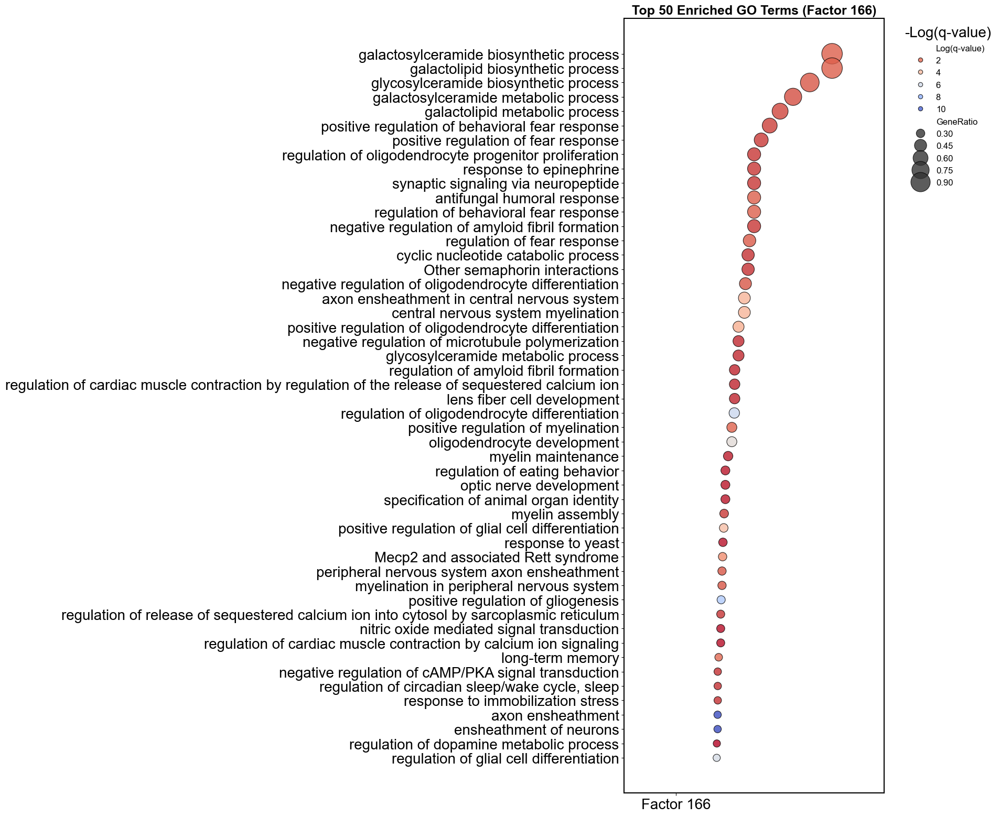

In [83]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl


mpl.rcParams['font.family'] = 'Arial'
overall_df = pd.read_csv('top300_genes_Factor166_overall_enrichment/Enrichment_GO/_FINAL_GO.csv')
overall_df = overall_df[['Description', 'Log(q-value)', 'Enrichment']].copy()
overall_df['GeneRatio'] = overall_df['Enrichment'] / overall_df['Enrichment'].max()
overall_df = overall_df.sort_values('Enrichment', ascending=False).head(50)

long_df = overall_df.copy()
long_df['x_pos'] = long_df['Enrichment'] / overall_df['Enrichment'].max() * 0.3

plt.figure(figsize=(20, 16))
ax = sns.scatterplot(
    data=long_df,
    x='x_pos', y='Description',
    size='GeneRatio', hue=-long_df['Log(q-value)'],
    sizes=(100, 800), palette='coolwarm_r', edgecolor='black', alpha=0.8
)

plt.xlim(-0.1, 0.4)
plt.xticks([0], ['Factor 166'])

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

plt.xlabel('', fontsize=16, fontweight='bold')
plt.ylabel('')
plt.title('Top 50 Enriched GO Terms (Factor 166)', fontsize=18, fontweight='bold')

plt.legend(title='-Log(q-value)', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

plt.tight_layout()
plt.savefig('Factor166_Overall_Top50_GO.svg', format='svg', bbox_inches='tight')

plt.show()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/4198648889.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/4198648889.py:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


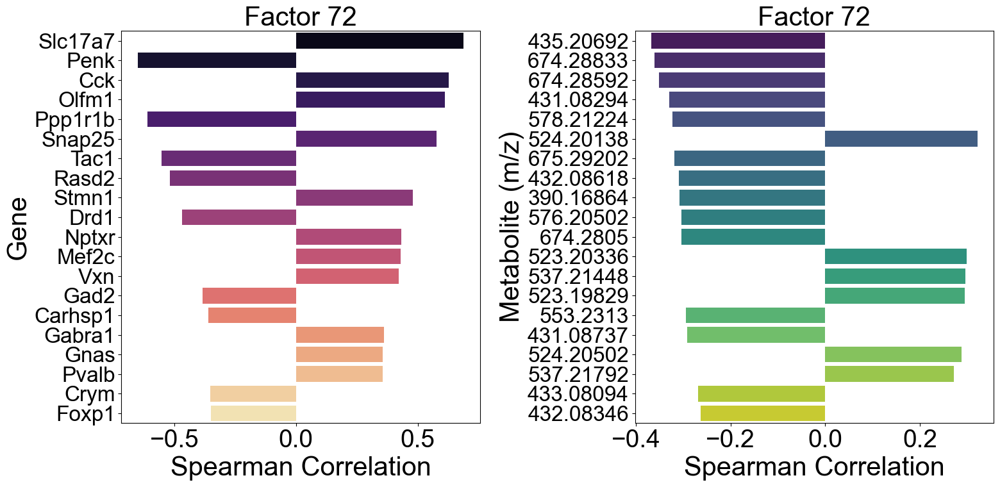

In [120]:
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

# ---------------------------------------------------------
# Settings
# ---------------------------------------------------------
plt.rcParams['font.family'] = 'Arial'
factor_idx = 72  # factor of interest

# ---------------------------------------------------------
# Helper: parse factor id
# ---------------------------------------------------------
def parse_factor_id(x):
    m = re.search(r'(\d+)$', str(x))
    return int(m.group(1)) if m else np.nan

# ---------------------------------------------------------
# Ensure numeric Factor_id exists
# ---------------------------------------------------------
if 'Factor_id' not in gene_corr_df.columns:
    gene_corr_df['Factor_id'] = gene_corr_df['Factor'].apply(parse_factor_id)
if 'Factor_id' not in met_corr_df.columns:
    met_corr_df['Factor_id'] = met_corr_df['Factor'].apply(parse_factor_id)

# ---------------------------------------------------------
# Select top 20 by |Correlation| (high → low)
# ---------------------------------------------------------
top_genes_factor = (
    gene_corr_df[gene_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

top_mets_factor = (
    met_corr_df[met_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

# ---------------------------------------------------------
# Sort for plotting (weak → strong so invert_yaxis puts strong on top)
# ---------------------------------------------------------
top_genes_factor = top_genes_factor.sort_values('abs_corr', ascending=True)
top_mets_factor  = top_mets_factor.sort_values('abs_corr', ascending=True)

# ---------------------------------------------------------
# Color mapping: deep → light for strong → weak
# ---------------------------------------------------------
gene_norm = mpl.colors.Normalize(
    vmin=top_genes_factor['abs_corr'].min(),
    vmax=top_genes_factor['abs_corr'].max()
)
met_norm = mpl.colors.Normalize(
    vmin=top_mets_factor['abs_corr'].min(),
    vmax=top_mets_factor['abs_corr'].max()
)

gene_colors = sns.color_palette(
    "magma_r", n_colors=len(top_genes_factor)
)
met_colors = sns.color_palette(
    "viridis_r", n_colors=len(top_mets_factor)
)

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# ---------------------------------------------------------
# Left panel: gene correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[0],
    y='Gene',
    x='Correlation',
    data=top_genes_factor,
    palette=gene_colors
)
axes[0].set_title(f'Factor {factor_idx}', fontsize=30)
axes[0].set_xlabel('Spearman Correlation', fontsize=30)
axes[0].set_ylabel('Gene', fontsize=30)
axes[0].tick_params(axis='x', labelsize=28)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Right panel: metabolite correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[1],
    y='Metabolite',
    x='Correlation',
    data=top_mets_factor,
    palette=met_colors
)
axes[1].set_title(f'Factor {factor_idx}', fontsize=30)
axes[1].set_xlabel('Spearman Correlation', fontsize=30)
axes[1].set_ylabel('Metabolite (m/z)', fontsize=30)
axes[1].tick_params(axis='x', labelsize=28)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Final layout and save
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(f'Factor_{factor_idx}.svg', format='svg', bbox_inches='tight')
plt.show()


/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2764048916.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/ly/l_ycn3sd0jg23c12y2s283180000gn/T/ipykernel_11529/2764048916.py:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


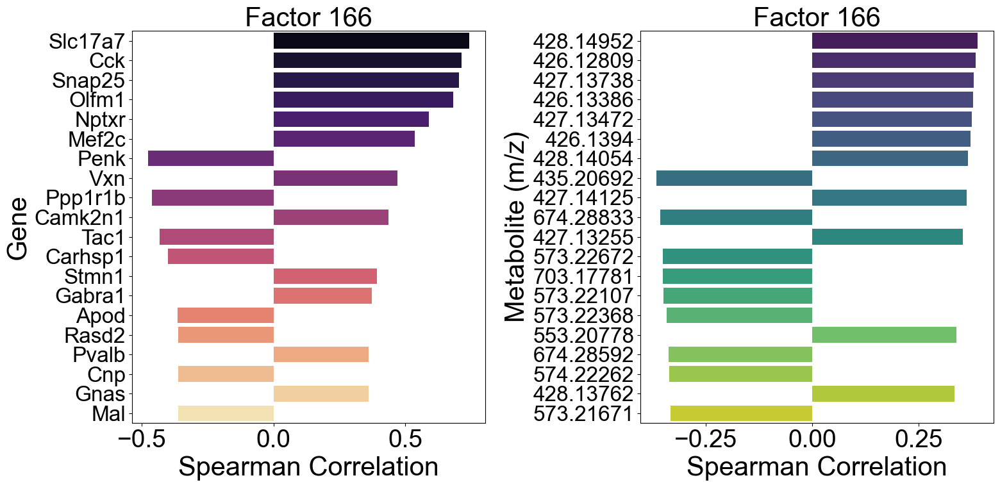

In [121]:
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

# ---------------------------------------------------------
# Settings
# ---------------------------------------------------------
plt.rcParams['font.family'] = 'Arial'
factor_idx = 166  # factor of interest

# ---------------------------------------------------------
# Helper: parse factor id
# ---------------------------------------------------------
def parse_factor_id(x):
    m = re.search(r'(\d+)$', str(x))
    return int(m.group(1)) if m else np.nan

# ---------------------------------------------------------
# Ensure numeric Factor_id exists
# ---------------------------------------------------------
if 'Factor_id' not in gene_corr_df.columns:
    gene_corr_df['Factor_id'] = gene_corr_df['Factor'].apply(parse_factor_id)
if 'Factor_id' not in met_corr_df.columns:
    met_corr_df['Factor_id'] = met_corr_df['Factor'].apply(parse_factor_id)

# ---------------------------------------------------------
# Select top 20 by |Correlation| (high → low)
# ---------------------------------------------------------
top_genes_factor = (
    gene_corr_df[gene_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

top_mets_factor = (
    met_corr_df[met_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

# ---------------------------------------------------------
# Sort for plotting (weak → strong so invert_yaxis puts strong on top)
# ---------------------------------------------------------
top_genes_factor = top_genes_factor.sort_values('abs_corr', ascending=True)
top_mets_factor  = top_mets_factor.sort_values('abs_corr', ascending=True)

# ---------------------------------------------------------
# Color mapping: deep → light for strong → weak
# ---------------------------------------------------------
gene_norm = mpl.colors.Normalize(
    vmin=top_genes_factor['abs_corr'].min(),
    vmax=top_genes_factor['abs_corr'].max()
)
met_norm = mpl.colors.Normalize(
    vmin=top_mets_factor['abs_corr'].min(),
    vmax=top_mets_factor['abs_corr'].max()
)

gene_colors = sns.color_palette(
    "magma_r", n_colors=len(top_genes_factor)
)
met_colors = sns.color_palette(
    "viridis_r", n_colors=len(top_mets_factor)
)

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# ---------------------------------------------------------
# Left panel: gene correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[0],
    y='Gene',
    x='Correlation',
    data=top_genes_factor,
    palette=gene_colors
)
axes[0].set_title(f'Factor {factor_idx}', fontsize=30)
axes[0].set_xlabel('Spearman Correlation', fontsize=30)
axes[0].set_ylabel('Gene', fontsize=30)
axes[0].tick_params(axis='x', labelsize=28)
axes[0].tick_params(axis='y', labelsize=24)
axes[0].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Right panel: metabolite correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[1],
    y='Metabolite',
    x='Correlation',
    data=top_mets_factor,
    palette=met_colors
)
axes[1].set_title(f'Factor {factor_idx}', fontsize=30)
axes[1].set_xlabel('Spearman Correlation', fontsize=30)
axes[1].set_ylabel('Metabolite (m/z)', fontsize=30)
axes[1].tick_params(axis='x', labelsize=28)
axes[1].tick_params(axis='y', labelsize=24)
axes[1].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Final layout and save
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(f'Factor_{factor_idx}.svg', format='svg', bbox_inches='tight')
plt.show()


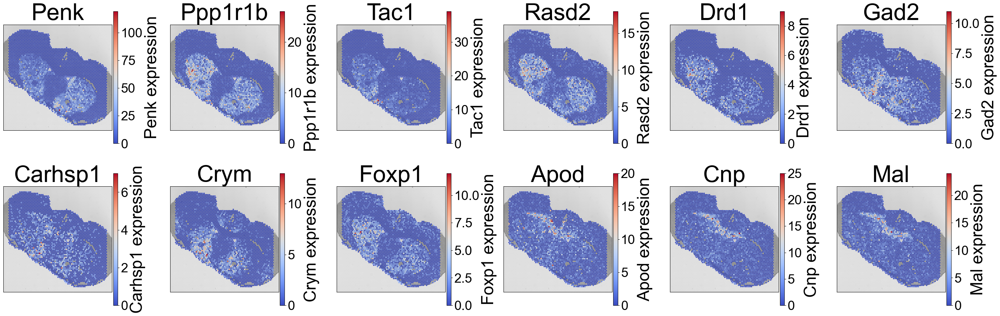

In [119]:
import scanpy as sc
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Selected genes for spatial visualization
# ---------------------------------------------------------
selected_genes = [
    'Penk', 'Ppp1r1b', 'Tac1', 'Rasd2', 'Drd1',
    'Gad2', 'Carhsp1', 'Crym', 'Foxp1', 'Apod', 'Cnp', 'Mal'
]

# ---------------------------------------------------------
# Define subplot layout (2 rows × 6 columns)
# ---------------------------------------------------------
ncols = 6
nrows = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))

# ---------------------------------------------------------
# Plot spatial expression for each selected gene
# ---------------------------------------------------------
for idx, gene in enumerate(selected_genes):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata_filtered,
        color=gene,
        cmap='coolwarm',
        size=5,
        spot_size=100,
        img_key='hires',
        bw=True,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(f'{gene} expression', fontsize=36, fontname='Arial')
    cbar.ax.tick_params(labelsize=28)

    # Aesthetic adjustments
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(gene, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'Factor72&166_genes_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


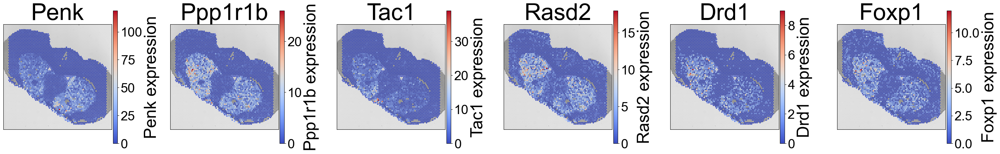

In [118]:
import scanpy as sc
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Selected genes for spatial visualization
# ---------------------------------------------------------
selected_genes = [
    'Penk', 'Ppp1r1b', 'Tac1', 'Rasd2', 'Drd1', 'Foxp1'
]

# ---------------------------------------------------------
# Define subplot layout (2 rows × 6 columns)
# ---------------------------------------------------------
ncols = 6
nrows = 1
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))

# ---------------------------------------------------------
# Plot spatial expression for each selected gene
# ---------------------------------------------------------
for idx, gene in enumerate(selected_genes):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata_filtered,
        color=gene,
        cmap='coolwarm',
        size=5,
        spot_size=100,
        img_key='hires',
        bw=True,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(f'{gene} expression', fontsize=36, fontname='Arial')
    cbar.ax.tick_params(labelsize=28)

    # Aesthetic adjustments
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(gene, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'selected Factor72&166_genes_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


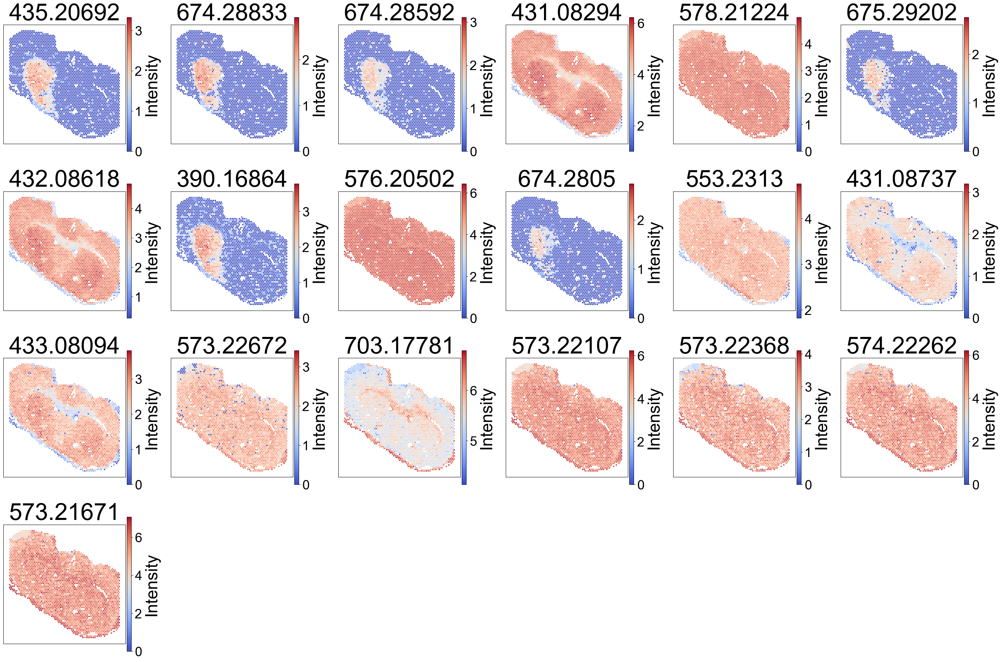

In [117]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

adata.obsm['spatial'] = adata.obs[['x', 'y']].values


selected_metabolites = [
    '435.20692', '674.28833', '674.28592', '431.08294', '578.21224',
    '675.29202', '432.08618', '390.16864', '576.20502', '674.2805',
    '553.2313', '431.08737', '433.08094', '573.22672', '703.17781',
    '573.22107', '573.22368', '574.22262', '573.21671'
]

# Add prefix used in the AnnData object
marker_metabolites_prefixed = [f"met_{m}" for m in selected_metabolites]

# ---------------------------------------------------------
# Define subplot layout dynamically
# ---------------------------------------------------------
ncols = 6
nrows = int(np.ceil(len(marker_metabolites_prefixed) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))

# ---------------------------------------------------------
# Plot spatial distribution for each metabolite
# ---------------------------------------------------------
for idx, metabolite in enumerate(marker_metabolites_prefixed):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata,
        color=metabolite,
        cmap='coolwarm',
        size=2,
        spot_size=10,
        img_key=None,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Remove 'met_' prefix for display
    clean_metabolite_name = metabolite.replace('met_', '')

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(
        f'Intensity',
        fontsize=36,
        fontname='Arial'
    )
    cbar.ax.tick_params(labelsize=28)

    # Aesthetic adjustments
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(clean_metabolite_name, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Remove unused subplots
# ---------------------------------------------------------
for j in range(len(marker_metabolites_prefixed), nrows * ncols):
    fig.delaxes(axes.flatten()[j])

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'Factor72&166_mets_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


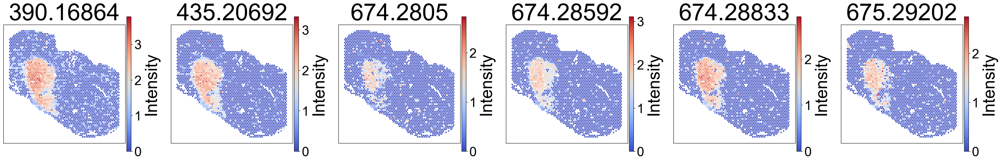

In [116]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

adata.obsm['spatial'] = adata.obs[['x', 'y']].values


selected_metabolites = [
    '390.16864','435.20692', '674.2805', '674.28592','674.28833', '675.29202'
]

# Add prefix used in the AnnData object
marker_metabolites_prefixed = [f"met_{m}" for m in selected_metabolites]

# ---------------------------------------------------------
# Define subplot layout dynamically
# ---------------------------------------------------------
ncols = 6
nrows = int(np.ceil(len(marker_metabolites_prefixed) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))

# ---------------------------------------------------------
# Plot spatial distribution for each metabolite
# ---------------------------------------------------------
for idx, metabolite in enumerate(marker_metabolites_prefixed):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata,
        color=metabolite,
        cmap='coolwarm',
        size=2,
        spot_size=10,
        img_key=None,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Remove 'met_' prefix for display
    clean_metabolite_name = metabolite.replace('met_', '')

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(
        f'Intensity',
        fontsize=36,
        fontname='Arial'
    )
    cbar.ax.tick_params(labelsize=28)

    # Aesthetic adjustments
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(clean_metabolite_name, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Remove unused subplots
# ---------------------------------------------------------
for j in range(len(marker_metabolites_prefixed), nrows * ncols):
    fig.delaxes(axes.flatten()[j])

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'Selected Factor72&166_mets_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


# Comparison

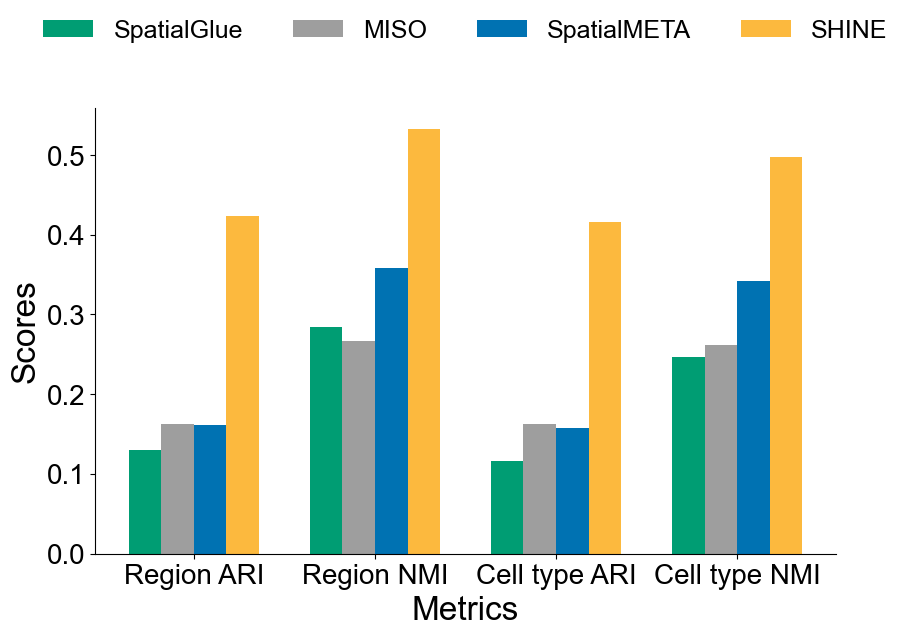

In [136]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Arial'

# -----------------------------
# Metrics and data
# -----------------------------
indicators = ['Region ARI', 'Region NMI', 'Cell type ARI', 'Cell type NMI']

SpatialGlue = [0.130, 0.284, 0.116, 0.247]
MISO = [0.163, 0.267, 0.162, 0.262]
SpatialMETA = [0.161, 0.358, 0.157, 0.342] 
SHINE = [0.423, 0.532, 0.416, 0.498]

methods = ['SpatialGlue', 'MISO', 'SpatialMETA', 'SHINE']

colors = [
    '#009D73',  # SpatialGlue
    '#9E9E9E',  # MISO (gray)
    '#0072B2',  # SpatialMETA
    '#FCB93E'   # SHINE
]

data = np.array([SpatialGlue, MISO, SpatialMETA, SHINE])

# -----------------------------
# Figure canvas
# -----------------------------
x = np.arange(len(indicators))
width = 0.18

fig, ax = plt.subplots(figsize=(9.5, 7))

# -----------------------------
# Bar plot
# -----------------------------
rects = []
for i, method in enumerate(methods):
    rect = ax.bar(
        x + (i - (len(methods) - 1) / 2) * width,
        data[i],
        width,
        label=method,
        color=colors[i]
    )
    rects.append(rect)

# -----------------------------
# Axes labels and ticks
# -----------------------------
ax.set_xlabel('Metrics', fontsize=24)
ax.set_ylabel('Scores', fontsize=24)
ax.set_xticks(x)
ax.set_xticklabels(indicators, fontsize=20)
ax.tick_params(axis='y', labelsize=20)

ax.legend(
    fontsize=18,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.25),
    ncol=4,
    frameon=False
)

# -----------------------------
# Simplify axes spines
# -----------------------------
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# -----------------------------
# Value annotations
# -----------------------------
# def autolabel(rects):
#     for rect in rects:
#         height = rect.get_height()
#         ax.annotate(
#             f'{height:.3f}',
#             xy=(rect.get_x() + rect.get_width() / 2, height),
#             xytext=(0, 4),
#             textcoords="offset points",
#             ha='center',
#             va='bottom',
#             fontsize=12,
#             fontfamily='Arial'
#         )

# for rect_group in rects:
#     autolabel(rect_group)

fig.tight_layout()

# -----------------------------
# Save figure
# -----------------------------
plt.savefig(
    'metrics_comparison.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


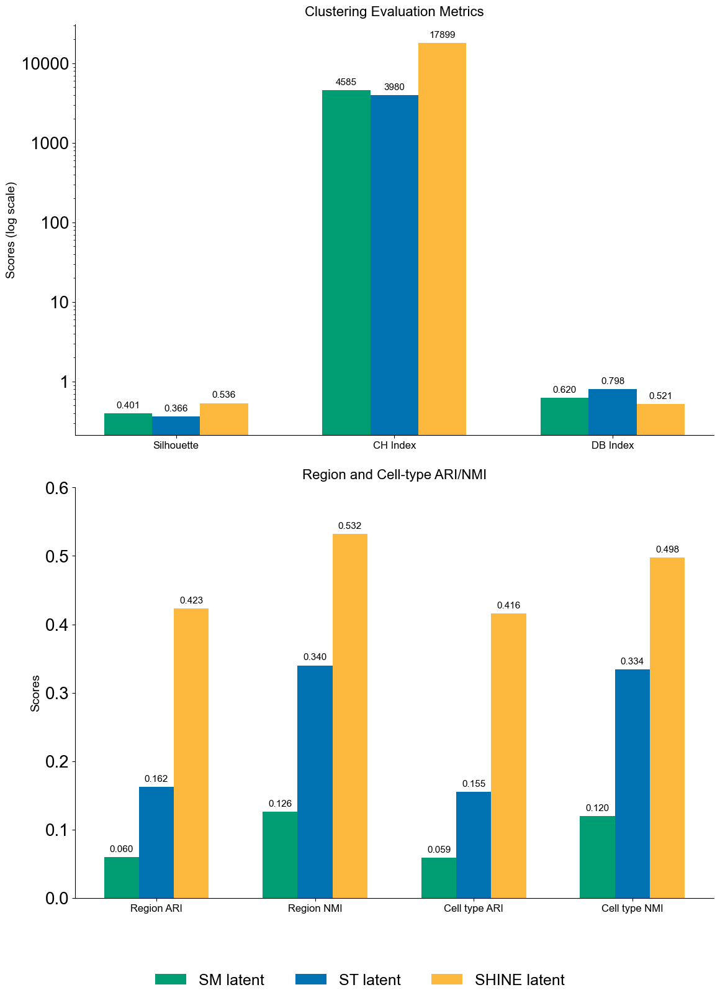

In [137]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

plt.rcParams['font.family'] = 'Arial'

# -----------------------------
# Methods and colors
# -----------------------------
methods = ['SM latent', 'ST latent', 'SHINE latent']
colors  = ['#009D73', '#0072b2', '#fcb93e']  # green / blue / orange

# -----------------------------
# Data
# -----------------------------
# Top panel: internal clustering metrics
indicators1 = ['Silhouette', 'CH Index', 'DB Index']
SM_vals     = [0.401,  4585.278, 0.620]
ST_vals     = [0.366,  3979.576, 0.798]
SHINE_vals  = [0.536, 17898.619, 0.521]

# Bottom panel: region / cell-type ARI & NMI
indicators2 = ['Region ARI', 'Region NMI', 'Cell type ARI', 'Cell type NMI']
SM_vals2     = [0.060, 0.126, 0.059, 0.120]
ST_vals2     = [0.162, 0.340, 0.155, 0.334]
SHINE_vals2  = [0.423, 0.532, 0.416, 0.498]

left_data  = np.array([SM_vals, ST_vals, SHINE_vals])
right_data = np.array([SM_vals2, ST_vals2, SHINE_vals2])

# -----------------------------
# Figure canvas (two stacked subplots)
# -----------------------------
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

width = 0.22
x1 = np.arange(len(indicators1))
x2 = np.arange(len(indicators2))

# -----------------------------
# Top panel: clustering metrics (log scale)
# -----------------------------
bars_left = []
for i in range(len(methods)):
    bars = axes[0].bar(
        x1 + (i - 1) * width,
        left_data[i],
        width,
        color=colors[i],
        label=methods[i]
    )
    bars_left.append(bars)

axes[0].set_title('Clustering Evaluation Metrics', fontsize=16, pad=10)
axes[0].set_xticks(x1)
axes[0].set_xticklabels(indicators1, fontsize=12)
axes[0].set_ylabel('Scores (log scale)', fontsize=14)
axes[0].set_yscale('log')
axes[0].yaxis.set_major_formatter(ScalarFormatter())

for spine in ['top', 'right']:
    axes[0].spines[spine].set_visible(False)

# -----------------------------
# Bottom panel: ARI / NMI (linear scale)
# -----------------------------
bars_right = []
for i in range(len(methods)):
    bars = axes[1].bar(
        x2 + (i - 1) * width,
        right_data[i],
        width,
        color=colors[i],
        label=methods[i]
    )
    bars_right.append(bars)

axes[1].set_title('Region and Cell-type ARI/NMI', fontsize=16, pad=10)
axes[1].set_xticks(x2)
axes[1].set_xticklabels(indicators2, fontsize=12)
axes[1].set_ylabel('Scores', fontsize=14)
axes[1].set_ylim(0, 0.60)

for spine in ['top', 'right']:
    axes[1].spines[spine].set_visible(False)

# -----------------------------
# Shared legend (bottom, horizontal)
# -----------------------------
handles = [bars_left[i][0] for i in range(len(methods))]
fig.legend(
    handles,
    methods,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.02),
    ncol=3,
    frameon=False,
    fontsize=18
)

# -----------------------------
# Value annotations (all above bars)
# -----------------------------
def autolabel(ax, bars, fmt_small='{:.3f}', fmt_large='{:.0f}', dy=4):
    """Annotate values above bars"""
    for rect in bars:
        h = rect.get_height()
        label = (fmt_large if h >= 100 else fmt_small).format(h)
        ax.annotate(
            label,
            xy=(rect.get_x() + rect.get_width() / 2, h),
            xytext=(0, dy),
            textcoords="offset points",
            ha='center',
            va='bottom',
            fontsize=11,
            color='black',
            clip_on=False
        )

for grp in bars_left:
    autolabel(axes[0], grp)
for grp in bars_right:
    autolabel(axes[1], grp)

# Leave space for the bottom legend
plt.tight_layout(rect=[0, 0.05, 1, 1])

# -----------------------------
# Save and show
# -----------------------------
plt.savefig(
    'latent_methods_comparison.svg',
    format='svg',
    bbox_inches='tight'
)
plt.show()


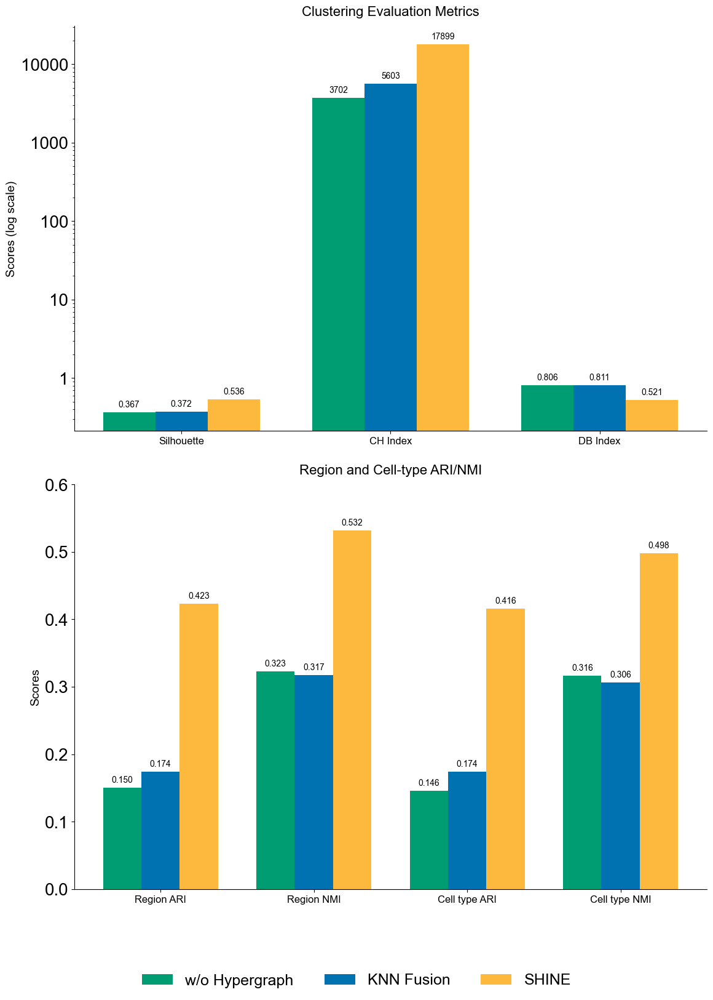

In [138]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

plt.rcParams['font.family'] = 'Arial'

# -----------------------------
# Methods and colors
# -----------------------------
methods = ['w/o Hypergraph', 'KNN Fusion', 'SHINE']
colors = ['#009D73', '#0072b2', '#fcb93e']  # green / blue / orange

# -----------------------------
# Data
# -----------------------------
# Top panel: internal clustering metrics
indicators1 = ['Silhouette', 'CH Index', 'DB Index']
wo_hyper = [0.367, 3701.541, 0.806]
wo_KNN_fusion = [0.372, 5603.217, 0.811]
SHINE = [0.536, 17898.619, 0.521]

# Bottom panel: region / cell-type ARI & NMI
indicators2 = ['Region ARI', 'Region NMI', 'Cell type ARI', 'Cell type NMI']
wo_hyper2 = [0.150, 0.323, 0.146, 0.316]
wo_KNN_fusion2 = [0.174, 0.317, 0.174, 0.306]
SHINE2 = [0.423, 0.532, 0.416, 0.498]

# -----------------------------
# Figure canvas (two stacked subplots)
# -----------------------------
fig, axes = plt.subplots(2, 1, figsize=(12, 16))

width = 0.25
x1 = np.arange(len(indicators1))
x2 = np.arange(len(indicators2))

# =========================
# Top panel: clustering metrics (log scale)
# =========================
r1 = axes[0].bar(x1 - width, wo_hyper, width,
                 label='w/o Hypergraph', color=colors[0])
r2 = axes[0].bar(x1, wo_KNN_fusion, width,
                 label='KNN Fusion', color=colors[1])
r3 = axes[0].bar(x1 + width, SHINE, width,
                 label='SHINE', color=colors[2])

axes[0].set_title('Clustering Evaluation Metrics', fontsize=16, pad=12)
axes[0].set_xticks(x1)
axes[0].set_xticklabels(indicators1, fontsize=12)
axes[0].set_ylabel('Scores (log scale)', fontsize=14)
axes[0].set_yscale('log')
axes[0].yaxis.set_major_formatter(ScalarFormatter())

for spine in ['top', 'right']:
    axes[0].spines[spine].set_visible(False)

# =========================
# Bottom panel: ARI / NMI (linear scale)
# =========================
r4 = axes[1].bar(x2 - width, wo_hyper2, width,
                 label='w/o Hypergraph', color=colors[0])
r5 = axes[1].bar(x2, wo_KNN_fusion2, width,
                 label='KNN Fusion', color=colors[1])
r6 = axes[1].bar(x2 + width, SHINE2, width,
                 label='SHINE', color=colors[2])

axes[1].set_title('Region and Cell-type ARI/NMI', fontsize=16, pad=12)
axes[1].set_xticks(x2)
axes[1].set_xticklabels(indicators2, fontsize=12)
axes[1].set_ylabel('Scores', fontsize=14)
axes[1].set_ylim(0, 0.60)

for spine in ['top', 'right']:
    axes[1].spines[spine].set_visible(False)

# =========================
# Shared legend (bottom, centered)
# =========================
handles = [r1[0], r2[0], r3[0]]
fig.legend(
    handles,
    methods,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.03),
    ncol=3,
    frameon=False,
    fontsize=18
)

# =========================
# Value annotations
# =========================
def autolabel(ax, bars, fmt_small='{:.3f}', fmt_large='{:.0f}'):
    """Annotate values above bars"""
    for b in bars:
        h = b.get_height()
        label = (fmt_large if h >= 100 else fmt_small).format(h)
        ax.annotate(
            label,
            xy=(b.get_x() + b.get_width() / 2, h),
            xytext=(0, 4),
            textcoords='offset points',
            ha='center',
            va='bottom',
            fontsize=10,
            clip_on=False
        )

for grp in (r1, r2, r3):
    autolabel(axes[0], grp)

for grp in (r4, r5, r6):
    autolabel(axes[1], grp)

# Leave space for the bottom legend
plt.tight_layout(rect=[0, 0.05, 1, 1])

# -----------------------------
# Save and show
# -----------------------------
plt.savefig(
    'wo_comparison_metrics.svg',
    format='svg',
    bbox_inches='tight'
)
plt.show()
